# 0 . 개요

**하기 2개 데이터를 전반적인 내용들을 검토해 보았습니다.**

**- dlvr_call : 배달 데이터**

**- StartupOrClosing_Region_ver2 : 업종/지역별 창업/폐업 유추 데이터**

# 1. 관련 라이브러리 불러오기

In [3]:
import numpy as np
import pandas as pd
import os
import gc

pd.set_option('display.max_colwidth', None)
pd.set_option('display.max_columns', None)

import matplotlib.pyplot as plt
import seaborn as sns

# 한글 깨짐 현상을 막기 위해 폰트 변경
sns.set(font="LG Smart_H2.0", 
        rc={"axes.unicode_minus":False},
        style='darkgrid')


# 위/경도 기반 데이터 시각화
from geopy.distance import great_circle
import folium
import json
import webbrowser

# 2. 데이터 불러오기

In [ ]:
Dlvr = pd.read_csv("dlvr_call.csv")
Region = pd.read_csv("StartupOrClosing_Region_ver2.csv")

#Region = pd.read_csv("StartupOrClosing_Region.csv",encoding='CP949')
# 'utf-8' codec can't decode byte 0xb0 in position 0: invalid start byte 에러 발생시 encoding 옵션을 window10에서 쓰는 CP949로 바꾸면 됨.

# 3. EDA - dlvr_call.csv

In [3]:
Dlvr.head(10)

,SN,PROCESS_DT,DLVR_REQUST_ENTRPS_ID,DLVR_REQUST_STTUS_VALUE,DLVR_RCEPT_ENTRPS_ID,DLVR_STORE_ID,DLVR_STORE_INDUTY_NM,DLVR_STORE_LEGALDONG_CODE,DLVR_STORE_BRTC_NM,DLVR_STORE_SIGNGU_NM,DLVR_STORE_LEGALDONG_NM,DLVR_STORE_LI_NM,DLVR_STORE_ADSTRD_CODE,DLVR_STORE_RDNMADR_CODE,DLVR_DSTN_LEGALDONG_CODE,DLVR_DSTN_BRTC_NM,DLVR_DSTN_SIGNGU_NM,DLVR_DSTN_LEGALDONG_NM,DLVR_DSTN_LI_NM,DLVR_DSTN_ADSTRD_CODE,DLVR_DSTN_RDNMADR_CODE,DLVR_MAN_ID,DLVR_AMOUNT,CALL_RLAY_FEE_AMOUNT,GOODS_AMOUNT,SETLE_KND_VALUE,SETLE_CARD_NM,DLVR_RCEPT_TIME,DLVR_CARALC_TIME,DLVR_RECPT_TIME,DLVR_COMPT_TIME,DLVR_CANCL_TIME
0,3486929,2019-12-01,C000101,1,C000101,S0021950,족발/보쌈,1156013200,서울특별시,영등포구,신길동,\N,1156066000,115603000023,1159010800,서울특별시,동작구,대방동,\N,1159066000,115904157098,D0006140,3300,200,18000,1,승인:KB국민카드,2019-12-01 20:47:52,2019-12-01 20:48:11,2019-12-01 20:55:33,2019-12-01 21:00:15,\N
1,3486930,2019-12-01,C000099,1,C000099,S0039210,치킨,4128510200,경기도,고양시 일산동구,중산동,\N,4128552000,412854379205,4128510200,경기도,고양시 일산동구,중산동,\N,4128552000,412853193037,D0005898,2900,0,21900,1,승인:현대카드사,2019-12-01 21:58:07,2019-12-01 22:01:06,2019-12-01 22:20:53,2019-12-01 22:26:01,\N
2,3486932,2019-12-01,C000029,1,C000043,S0036135,치킨,4115010100,경기도,의정부시,의정부동,\N,4115051000,411504343421,4115011100,경기도,의정부시,녹양동,\N,4115062000,411504343083,D0000864,3500,200,19500,2,NaN,2019-12-01 22:20:31,2019-12-01 22:37:45,2019-12-01 22:58:27,2019-12-01 22:58:32,\N
3,3486933,2019-12-01,C000105,1,C000105,S0039956,돈까스/일식,4128510400,경기도,고양시 일산동구,장항동,\N,4128559000,412854379097,4128510500,경기도,고양시 일산동구,마두동,\N,4128556000,412854379158,D0001526,3500,0,18000,2,NaN,2019-12-01 21:40:39,2019-12-01 21:48:41,2019-12-01 22:06:35,2019-12-01 22:17:57,\N
4,3486934,2019-12-01,C000028,1,C000043,S0003074,치킨,4115010900,경기도,의정부시,금오동,\N,4115058000,411504343342,4115010900,경기도,의정부시,금오동,\N,4115058000,411503181019,D0000986,3500,200,18000,3,NaN,2019-12-01 19:44:37,2019-12-01 19:48:07,2019-12-01 19:54:30,2019-12-01 20:00:22,\N
5,3486940,2019-12-01,C000237,1,C000237,S0021813,아시안/양식,4121010100,경기도,광명시,광명동,\N,4121055000,412103187064,4121010200,경기도,광명시,철산동,\N,4121060000,412103187028,D0003991,3300,200,19000,2,NaN,2019-12-01 19:08:19,2019-12-01 19:37:13,2019-12-01 19:58:04,2019-12-01 19:58:06,\N
6,3486941,2019-12-01,C000250,1,C000250,S0019514,족발/보쌈,4119011300,경기도,부천시,괴안동,\N,4119079500,411903185010,4119010700,경기도,부천시,역곡동,\N,4119060600,411904352372,D0004334,3000,200,32000,1,승인:KB국민카드,2019-12-01 21:17:12,2019-12-01 21:17:50,2019-12-01 21:23:22,2019-12-01 21:36:15,\N
7,3486942,2019-12-01,C000240,1,C000238,S0020310,카페/디저트,4119011400,경기도,부천시,송내동,\N,4119074600,411904355059,4119010800,경기도,부천시,중동,\N,4119074200,411903184007,D0004845,4500,200,17500,2,NaN,2019-12-01 21:18:23,2019-12-01 21:19:58,2019-12-01 21:48:09,2019-12-01 21:48:59,\N
8,3486943,2019-12-01,C000254,1,C000254,S0021038,치킨,4119010800,경기도,부천시,중동,\N,4119061000,411904352531,4119010900,경기도,부천시,상동,\N,4119074400,411904352050,D0005264,3500,200,15500,2,NaN,2019-12-01 18:37:31,2019-12-01 19:08:13,2019-12-01 19:26:18,2019-12-01 19:28:36,\N
9,3486946,2019-12-01,C000049,1,C000049,S0022458,패스트푸드,1153010800,서울특별시,구로구,오류동,\N,1153077000,115304148076,1153010900,서울특별시,구로구,궁동,\N,1153079000,115304148440,D0004578,3000,400,11500,2,NaN,2019-12-01 20:22:17,2019-12-01 20:37:16,2019-12-01 20:44:49,2019-12-01 21:04:42,\N


In [4]:
Dlvr.tail(10)

,SN,PROCESS_DT,DLVR_REQUST_ENTRPS_ID,DLVR_REQUST_STTUS_VALUE,DLVR_RCEPT_ENTRPS_ID,DLVR_STORE_ID,DLVR_STORE_INDUTY_NM,DLVR_STORE_LEGALDONG_CODE,DLVR_STORE_BRTC_NM,DLVR_STORE_SIGNGU_NM,DLVR_STORE_LEGALDONG_NM,DLVR_STORE_LI_NM,DLVR_STORE_ADSTRD_CODE,DLVR_STORE_RDNMADR_CODE,DLVR_DSTN_LEGALDONG_CODE,DLVR_DSTN_BRTC_NM,DLVR_DSTN_SIGNGU_NM,DLVR_DSTN_LEGALDONG_NM,DLVR_DSTN_LI_NM,DLVR_DSTN_ADSTRD_CODE,DLVR_DSTN_RDNMADR_CODE,DLVR_MAN_ID,DLVR_AMOUNT,CALL_RLAY_FEE_AMOUNT,GOODS_AMOUNT,SETLE_KND_VALUE,SETLE_CARD_NM,DLVR_RCEPT_TIME,DLVR_CARALC_TIME,DLVR_RECPT_TIME,DLVR_COMPT_TIME,DLVR_CANCL_TIME
4296261,7750541,2020-03-31,C000224,1,C000224,S0035329,분식,4127110400,경기도,안산시 상록구,본오동,\N,4127156000,4.12713E+11,4127110300,경기도,안산시 상록구,사동,\N,4127153700,4.12714E+11,D0009816,3520,200,15000,2,NaN,2020-03-31 23:58,2020-03-31 23:59,2020-04-01 0:18,2020-04-01 0:23,\N
4296262,7750542,2020-03-31,C000129,1,C000129,S0003062,치킨,1138010400,서울특별시,은평구,갈현동,\N,1138055100,1.13804E+11,1138010300,서울특별시,은평구,불광동,\N,1138053000,1.13804E+11,D0002676,3500,400,2000,3,NaN,2020-03-31 23:58,2020-03-31 23:59,2020-04-01 0:16,2020-04-01 0:25,\N
4296263,7750543,2020-03-31,C000031,1,C000043,S0037800,치킨,4115010400,경기도,의정부시,신곡동,\N,4115056700,4.11504E+11,4115010100,경기도,의정부시,의정부동,\N,4115051000,4.11503E+11,D0010381,3500,300,0,2,NaN,2020-03-31 23:59,2020-04-01 0:00,2020-04-01 0:25,2020-04-01 0:55,\N
4296264,7750544,2020-03-31,C000028,1,C000043,S0037021,치킨,4115010100,경기도,의정부시,의정부동,\N,4115051000,4.11503E+11,4115010100,경기도,의정부시,의정부동,\N,4115051000,4.11504E+11,D0004971,3500,300,21000,2,NaN,2020-03-31 23:57,2020-03-31 23:57,2020-04-01 0:06,2020-04-01 0:06,\N
4296265,7750545,2020-03-31,C000129,1,C000129,S0003062,치킨,1138010400,서울특별시,은평구,갈현동,\N,1138055100,1.13804E+11,1138010400,서울특별시,은평구,갈현동,\N,1138055200,1.13804E+11,D0002676,3500,400,2500,3,NaN,2020-03-31 23:56,2020-03-31 23:56,2020-04-01 0:11,2020-04-01 0:13,\N
4296266,7750546,2020-03-31,C000237,1,C000237,S0021188,족발/보쌈,4121010200,경기도,광명시,철산동,\N,4121060000,4.12103E+11,4121010200,경기도,광명시,철산동,\N,4121059000,4.12103E+11,D0009705,3300,300,20900,2,NaN,2020-03-31 23:56,2020-03-31 23:56,2020-04-01 0:14,2020-04-01 0:18,\N
4296267,7750548,2020-03-31,C000104,1,C000102,S0021967,치킨,1156013300,서울특별시,영등포구,대림동,\N,1156070000,1.15603E+11,1162010200,서울특별시,관악구,신림동,\N,1162065500,1.16204E+11,D0002307,6300,200,26000,1,승인:신한카드,2020-03-31 23:55,2020-03-31 23:55,2020-04-01 0:17,2020-04-01 0:26,\N
4296268,7750550,2020-03-31,C000224,1,C000224,S0035329,분식,4127110400,경기도,안산시 상록구,본오동,\N,4127156000,4.12713E+11,4127310100,경기도,안산시 단원구,고잔동,\N,4127353500,4.12734E+11,D0009816,5500,200,17000,1,승인:롯데카드사,2020-03-31 23:58,2020-03-31 23:59,2020-04-01 0:18,2020-04-01 0:30,\N
4296269,7750552,2020-03-31,C000130,1,C000130,S0002286,족발/보쌈,4128112300,경기도,고양시 덕양구,화정동,\N,4128162200,4.12813E+11,4128112800,경기도,고양시 덕양구,행신동,\N,4128165500,4.12814E+11,D0002233,4000,300,35000,2,NaN,2020-03-31 23:56,2020-04-01 0:01,2020-04-01 0:16,2020-04-01 0:23,\N
4296270,7750553,2020-03-31,C000209,1,C000209,S0022157,야식,1154510200,서울특별시,금천구,독산동,\N,1154562000,1.15453E+11,1154510200,서울특별시,금천구,독산동,\N,1154563000,1.15454E+11,D0009002,3300,300,30000,1,승인:비씨카드사,2020-03-31 23:55,2020-03-31 23:56,2020-04-01 0:11,2020-04-01 0:15,\N


In [5]:
Dlvr.shape

(4296271, 32)

In [6]:
Dlvr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4296271 entries, 0 to 4296270
Data columns (total 32 columns):
 #   Column                     Dtype 
---  ------                     ----- 
 0   SN                         int64 
 1   PROCESS_DT                 object
 2   DLVR_REQUST_ENTRPS_ID      object
 3   DLVR_REQUST_STTUS_VALUE    int64 
 4   DLVR_RCEPT_ENTRPS_ID       object
 5   DLVR_STORE_ID              object
 6   DLVR_STORE_INDUTY_NM       object
 7   DLVR_STORE_LEGALDONG_CODE  int64 
 8   DLVR_STORE_BRTC_NM         object
 9   DLVR_STORE_SIGNGU_NM       object
 10  DLVR_STORE_LEGALDONG_NM    object
 11  DLVR_STORE_LI_NM           object
 12  DLVR_STORE_ADSTRD_CODE     int64 
 13  DLVR_STORE_RDNMADR_CODE    object
 14  DLVR_DSTN_LEGALDONG_CODE   int64 
 15  DLVR_DSTN_BRTC_NM          object
 16  DLVR_DSTN_SIGNGU_NM        object
 17  DLVR_DSTN_LEGALDONG_NM     object
 18  DLVR_DSTN_LI_NM            object
 19  DLVR_DSTN_ADSTRD_CODE      object
 20  DLVR_DSTN_RDNMADR_CODE  

In [7]:
Dlvr.dtypes

SN                            int64
PROCESS_DT                   object
DLVR_REQUST_ENTRPS_ID        object
DLVR_REQUST_STTUS_VALUE       int64
DLVR_RCEPT_ENTRPS_ID         object
DLVR_STORE_ID                object
DLVR_STORE_INDUTY_NM         object
DLVR_STORE_LEGALDONG_CODE     int64
DLVR_STORE_BRTC_NM           object
DLVR_STORE_SIGNGU_NM         object
DLVR_STORE_LEGALDONG_NM      object
DLVR_STORE_LI_NM             object
DLVR_STORE_ADSTRD_CODE        int64
DLVR_STORE_RDNMADR_CODE      object
DLVR_DSTN_LEGALDONG_CODE      int64
DLVR_DSTN_BRTC_NM            object
DLVR_DSTN_SIGNGU_NM          object
DLVR_DSTN_LEGALDONG_NM       object
DLVR_DSTN_LI_NM              object
DLVR_DSTN_ADSTRD_CODE        object
DLVR_DSTN_RDNMADR_CODE       object
DLVR_MAN_ID                  object
DLVR_AMOUNT                   int64
CALL_RLAY_FEE_AMOUNT          int64
GOODS_AMOUNT                  int64
SETLE_KND_VALUE               int64
SETLE_CARD_NM                object
DLVR_RCEPT_TIME             

In [8]:
Dlvr.describe()

,SN,DLVR_REQUST_STTUS_VALUE,DLVR_STORE_LEGALDONG_CODE,DLVR_STORE_ADSTRD_CODE,DLVR_DSTN_LEGALDONG_CODE,DLVR_AMOUNT,CALL_RLAY_FEE_AMOUNT,GOODS_AMOUNT,SETLE_KND_VALUE
count,4.296271e+06,4.296271e+06,4.296271e+06,4.296271e+06,4.296271e+06,4.296271e+06,4.296271e+06,4.296271e+06,4.296271e+06
mean,6.856790e+06,1.017523e+00,3.445079e+09,3.445125e+09,3.417177e+09,3.661995e+03,2.495547e+02,2.126212e+04,1.812849e+00
std,1.875942e+06,1.312250e-01,1.248182e+09,1.248178e+09,1.264355e+09,7.457838e+02,9.198234e+01,1.278252e+04,5.481259e-01
min,3.486929e+06,1.000000e+00,1.123011e+09,1.123065e+09,1.111018e+09,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00
25%,5.241784e+06,1.000000e+00,4.115010e+09,4.115051e+09,4.115010e+09,3.300000e+03,2.000000e+02,1.550000e+04,1.000000e+00
50%,6.832042e+06,1.000000e+00,4.117310e+09,4.117361e+09,4.117110e+09,3.500000e+03,3.000000e+02,2.000000e+04,2.000000e+00
75%,8.474450e+06,1.000000e+00,4.125010e+09,4.125056e+09,4.125010e+09,3.800000e+03,3.000000e+02,2.650000e+04,2.000000e+00
max,1.094918e+07,4.000000e+00,4.183025e+09,4.183025e+09,5.011010e+09,1.055000e+05,1.183200e+04,1.235435e+06,3.000000e+00





## 날짜데이터 전처리

**'년-월-일'로 되어있는 날짜 데이터를 월 별 데이터로 구분하기 위해 전처리를 하였습니다.**

In [9]:
# 일별 데이터 -> 월별 데이터로 변환하여 PROCESS_DT_M 컬럼에 저장
Dlvr['PROCESS_DT_M'] = Dlvr['PROCESS_DT'].str.slice(start=0, stop=7)
Dlvr.head()

,SN,PROCESS_DT,DLVR_REQUST_ENTRPS_ID,DLVR_REQUST_STTUS_VALUE,DLVR_RCEPT_ENTRPS_ID,DLVR_STORE_ID,DLVR_STORE_INDUTY_NM,DLVR_STORE_LEGALDONG_CODE,DLVR_STORE_BRTC_NM,DLVR_STORE_SIGNGU_NM,DLVR_STORE_LEGALDONG_NM,DLVR_STORE_LI_NM,DLVR_STORE_ADSTRD_CODE,DLVR_STORE_RDNMADR_CODE,DLVR_DSTN_LEGALDONG_CODE,DLVR_DSTN_BRTC_NM,DLVR_DSTN_SIGNGU_NM,DLVR_DSTN_LEGALDONG_NM,DLVR_DSTN_LI_NM,DLVR_DSTN_ADSTRD_CODE,DLVR_DSTN_RDNMADR_CODE,DLVR_MAN_ID,DLVR_AMOUNT,CALL_RLAY_FEE_AMOUNT,GOODS_AMOUNT,SETLE_KND_VALUE,SETLE_CARD_NM,DLVR_RCEPT_TIME,DLVR_CARALC_TIME,DLVR_RECPT_TIME,DLVR_COMPT_TIME,DLVR_CANCL_TIME,PROCESS_DT_M
0,3486929,2019-12-01,C000101,1,C000101,S0021950,족발/보쌈,1156013200,서울특별시,영등포구,신길동,\N,1156066000,115603000023,1159010800,서울특별시,동작구,대방동,\N,1159066000,115904157098,D0006140,3300,200,18000,1,승인:KB국민카드,2019-12-01 20:47:52,2019-12-01 20:48:11,2019-12-01 20:55:33,2019-12-01 21:00:15,\N,2019-12
1,3486930,2019-12-01,C000099,1,C000099,S0039210,치킨,4128510200,경기도,고양시 일산동구,중산동,\N,4128552000,412854379205,4128510200,경기도,고양시 일산동구,중산동,\N,4128552000,412853193037,D0005898,2900,0,21900,1,승인:현대카드사,2019-12-01 21:58:07,2019-12-01 22:01:06,2019-12-01 22:20:53,2019-12-01 22:26:01,\N,2019-12
2,3486932,2019-12-01,C000029,1,C000043,S0036135,치킨,4115010100,경기도,의정부시,의정부동,\N,4115051000,411504343421,4115011100,경기도,의정부시,녹양동,\N,4115062000,411504343083,D0000864,3500,200,19500,2,NaN,2019-12-01 22:20:31,2019-12-01 22:37:45,2019-12-01 22:58:27,2019-12-01 22:58:32,\N,2019-12
3,3486933,2019-12-01,C000105,1,C000105,S0039956,돈까스/일식,4128510400,경기도,고양시 일산동구,장항동,\N,4128559000,412854379097,4128510500,경기도,고양시 일산동구,마두동,\N,4128556000,412854379158,D0001526,3500,0,18000,2,NaN,2019-12-01 21:40:39,2019-12-01 21:48:41,2019-12-01 22:06:35,2019-12-01 22:17:57,\N,2019-12
4,3486934,2019-12-01,C000028,1,C000043,S0003074,치킨,4115010900,경기도,의정부시,금오동,\N,4115058000,411504343342,4115010900,경기도,의정부시,금오동,\N,4115058000,411503181019,D0000986,3500,200,18000,3,NaN,2019-12-01 19:44:37,2019-12-01 19:48:07,2019-12-01 19:54:30,2019-12-01 20:00:22,\N,2019-12


**지역별 데이터를 확인해 본 결과, 해당 데이터 셋은 경기도와 서울특별시 2개로 이루어져 있음을 확인하였습니다.**

In [10]:
Dlvr['DLVR_STORE_BRTC_NM'].value_counts()

경기도      3315381
서울특별시     980890
Name: DLVR_STORE_BRTC_NM, dtype: int64

<AxesSubplot:xlabel='DLVR_STORE_BRTC_NM', ylabel='count'>

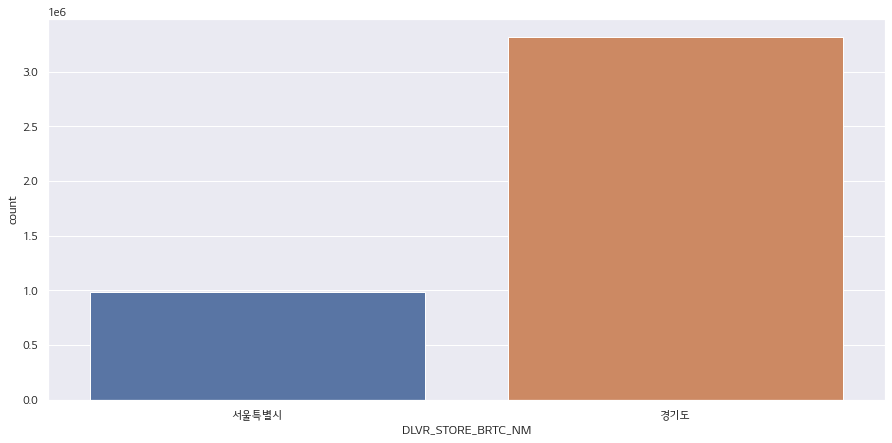

In [11]:
plt.figure(figsize = [15,7])
sns.countplot(data=Dlvr, x='DLVR_STORE_BRTC_NM')

**서울/경기 지역의 데이터를 좀 더 자세히 보기 위해 먼저 경기도 지역의 시/군/구 명으로 좀 더 세분화 하였습니다.**

In [12]:
Dlvr[Dlvr['DLVR_STORE_BRTC_NM'] =='경기도']['DLVR_STORE_SIGNGU_NM'].value_counts()


의정부시        1099517
부천시          548336
광명시          368327
고양시 덕양구      272814
안산시 상록구      155620
남양주시         152750
시흥시          126936
평택시          102961
동두천시          80220
포천시           74512
안양시 동안구       65559
화성시           58880
고양시 일산서구      50589
광주시           34603
고양시 일산동구      28848
양주시           24882
용인시 처인구       23046
파주시           13025
성남시 중원구        6730
성남시 수정구        6704
연천군            6299
수원시 권선구        6219
김포시            4801
수원시 팔달구        1198
구리시             972
안양시 만안구         489
이천시             394
수원시 장안구          86
여주시              53
양평군               6
하남시               2
안산시 단원구           2
오산시               1
Name: DLVR_STORE_SIGNGU_NM, dtype: int64

**Box Plot으로 확인 결과 아래와 같이 의정부시의 데이터가 가장 많음을 알 수 있습니다.**

**DACON 답변 확인 결과, 데이터 제공 측에서 데이터를 수집하는 배달대행업체가 해당 지역에 사업을 얼마나 하느냐에 따라 건수 
차이가 있을 수** 

**있다고 하였으므로 데이터가 적은 곳이 실제로 배달이 적은 곳이라는 점은 아닐수도 있다는 것을 상기하고 EDA 진행하였습니다.**

<AxesSubplot:title={'center':'경기도 배달 지역'}, xlabel='count', ylabel='DLVR_STORE_SIGNGU_NM'>

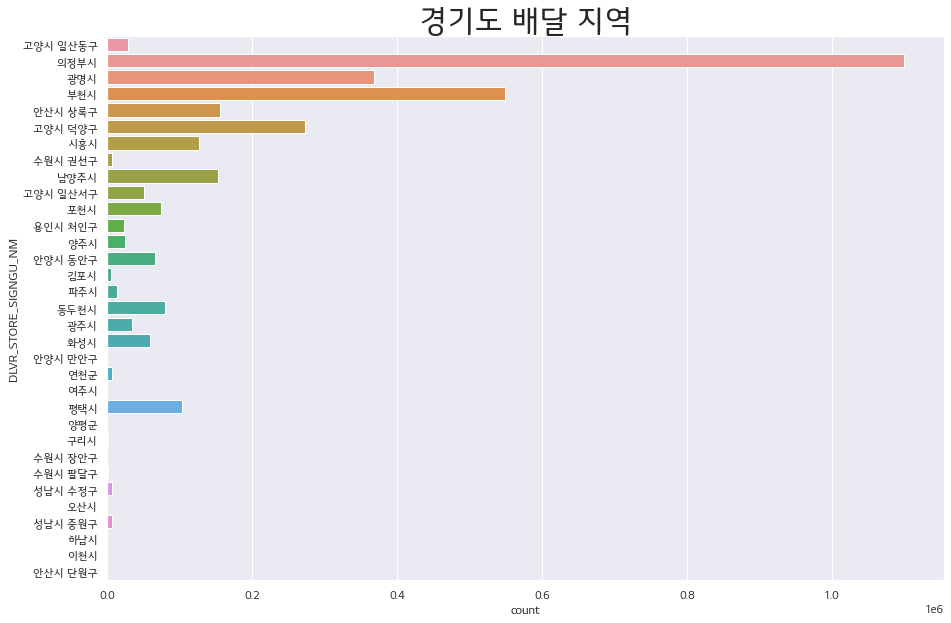

In [13]:
plt.figure(figsize = [15,10])
plt.title('경기도 배달 지역', size = 30)
sns.countplot(data=Dlvr[Dlvr['DLVR_STORE_BRTC_NM'] =='경기도'], y='DLVR_STORE_SIGNGU_NM')

**다음은 서울 특별시의 시/군/구 세분화 작업입니다.**

In [14]:
Dlvr[Dlvr['DLVR_STORE_BRTC_NM'] =='서울특별시']['DLVR_STORE_SIGNGU_NM'].value_counts()

구로구     357818
금천구     167738
영등포구    155350
도봉구      90283
은평구      81589
동작구      44280
관악구      28453
노원구      19849
양천구      18412
강북구       6940
서대문구      2856
서초구       2793
성북구       2413
강남구       1734
강동구        326
강서구         41
중랑구         11
송파구          3
동대문구         1
Name: DLVR_STORE_SIGNGU_NM, dtype: int64

**앞으로 서울지역만 분석 예정이기 때문에 따로 Dlvr_seoul 이라는 Data Frame을 만들었습니다.**

In [15]:
Dlvr_seoul = Dlvr[Dlvr['DLVR_STORE_BRTC_NM'] =='서울특별시']

**CountPlot으로 확인 결과 구로구가 가장 많은 데이터를 가지고 있음을 확인하였습니다.**

<AxesSubplot:title={'center':'서울시 배달 지역'}, xlabel='DLVR_STORE_SIGNGU_NM', ylabel='count'>

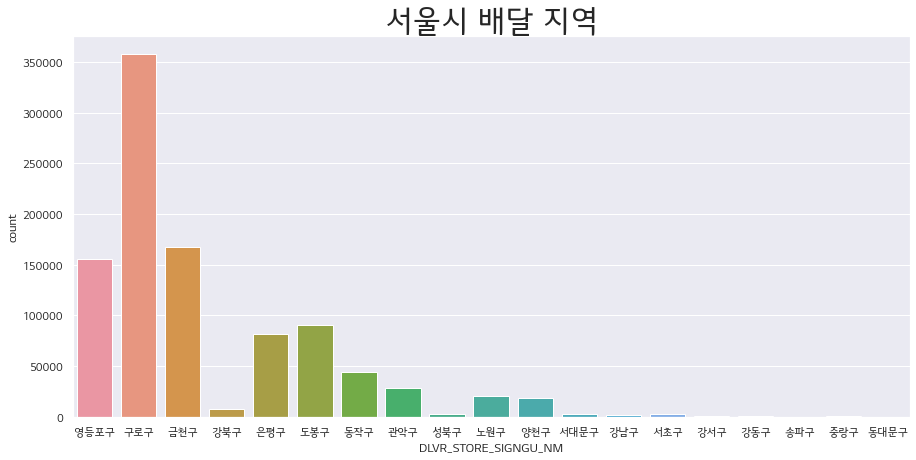

In [16]:
plt.figure(figsize = [15,7])
plt.title('서울시 배달 지역', size = 30)
sns.countplot(data=Dlvr_seoul, x='DLVR_STORE_SIGNGU_NM')

**다음은, 서울시의 배달량의 증감 추세를 분석해 보았습니다.**

**배달요청 상태의 변화량을 확인하면 배달량의 증감을 알 수 있다고 판단하여 기존에 전처리해둔 월별 Column과 함께**

**월별 배달량 추세를 시각화 해보았습니다.**


In [17]:
# 서울시 배달 상태
# 배달요청상태값 => 1: 완료, 2: 취소, 3:사고, 4:문의
Dlvr_seoul['DLVR_REQUST_STTUS_VALUE'].value_counts()

1    964990
2     15897
3         2
4         1
Name: DLVR_REQUST_STTUS_VALUE, dtype: int64

**서울 월별 배달요청 상태 변화량을 확인 결과, 1월을 기준으로 3월까지는 점점 우상향하였으나,**

**4월경 잠깐 하락, 5월에 다시 상향하는 추세를 보이고 있습니다.**

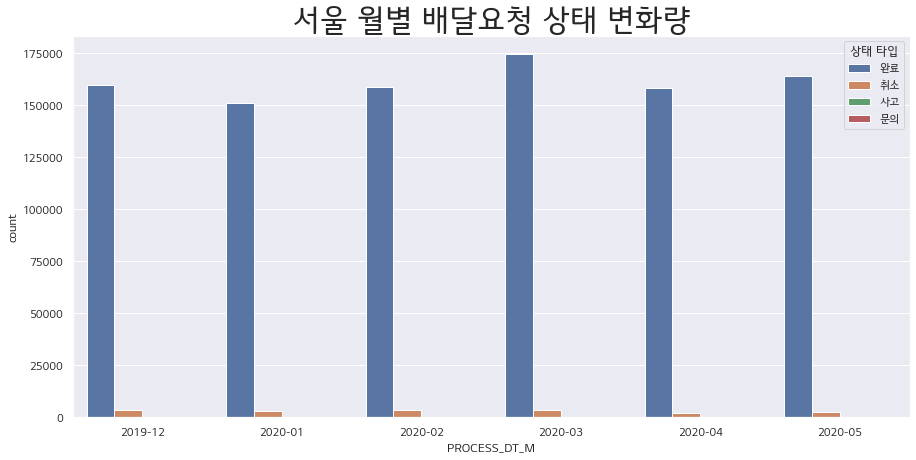

In [18]:
plt.figure(figsize = [15,7])
plt.title('서울 월별 배달요청 상태 변화량', size = 30)
ax = sns.countplot(data=Dlvr_seoul, x='PROCESS_DT_M',hue='DLVR_REQUST_STTUS_VALUE')
h,l = ax.get_legend_handles_labels()
labels=["완료", "취소", "사고","문의"]
ax.legend(h,labels,title="상태 타입",loc='upper right')
plt.show()

**전체 데이터(서울,경기도) 월별 배달 요청 상태 변화량을 확인 결과 전체적으로는 점점 우상향하고 있는 추세가 확인되었습니다.**

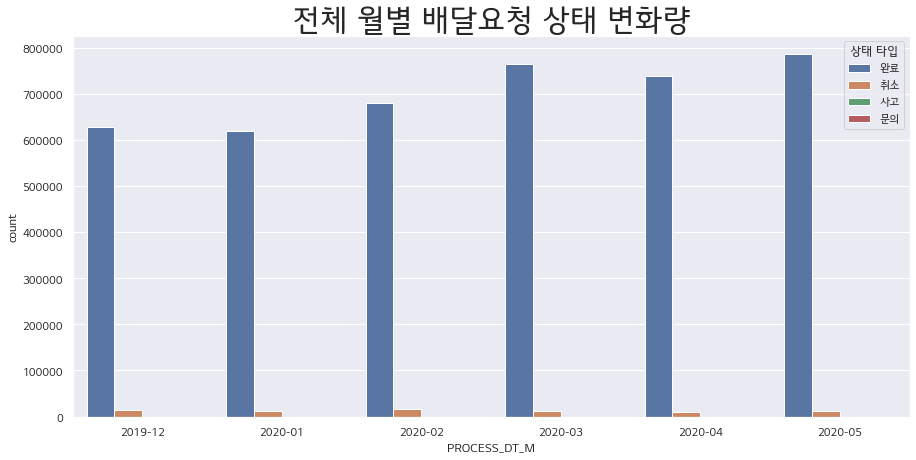

In [19]:
plt.figure(figsize = [15,7])
plt.title('전체 월별 배달요청 상태 변화량', size = 30)
ax = sns.countplot(data=Dlvr, x='PROCESS_DT_M',hue='DLVR_REQUST_STTUS_VALUE')
h,l = ax.get_legend_handles_labels()
labels=["완료", "취소", "사고","문의"]
ax.legend(h,labels,title="상태 타입",loc='upper right')
plt.show()

**다음은 서울 월별 결제 수단 변화량 분석입니다.**

**결제 타입은 아래와 같이 총 11가지로 구분되어 있으나 실제로는 카드,선불,현금 데이터만 존재하여 3개 Type에 대해서 변화량을 관찰하였습니다**


**결제타입 : 1.카드,2.선불,3.현금,4.현금->카드,5.카드->현금,6.카드->선불,7.선금->카드,8.선불->현금,9.현금->선불,10.후불.11.-**

**서울 월별 결제 수단 변화량을 확인해 보면 20년 3월 까지는 선불 결제가 많다가 4월부터 감소하는 추세로 확인되는데**

**이는 카드 결제가 증가하면서 발생한 것으로 예상됩니다.**

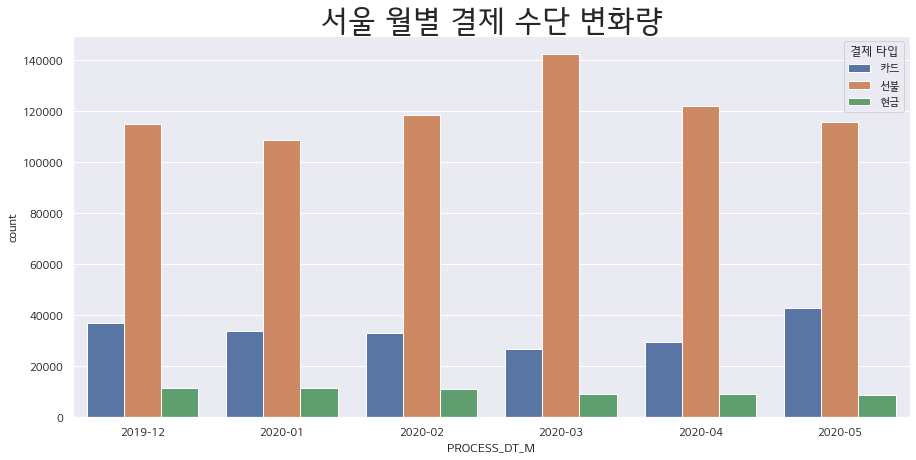

In [20]:
plt.figure(figsize = [15,7])
plt.title('서울 월별 결제 수단 변화량', size = 30)
ax = sns.countplot(data=Dlvr_seoul, x='PROCESS_DT_M',hue='SETLE_KND_VALUE')
h,l = ax.get_legend_handles_labels()
labels=["카드", "선불", "현금"]
ax.legend(h,labels,title="결제 타입",loc='upper right')
plt.show()

**전체(서울,경기도) 데이터 확인 결과 전체 데이터도 서울데이터와 유사하게 선불 결제는 20년 3월 이후로 감소,**

**카드 결제는 20년 3월 이후로 점점 증가하는 추세를 보이고 있습니다.**

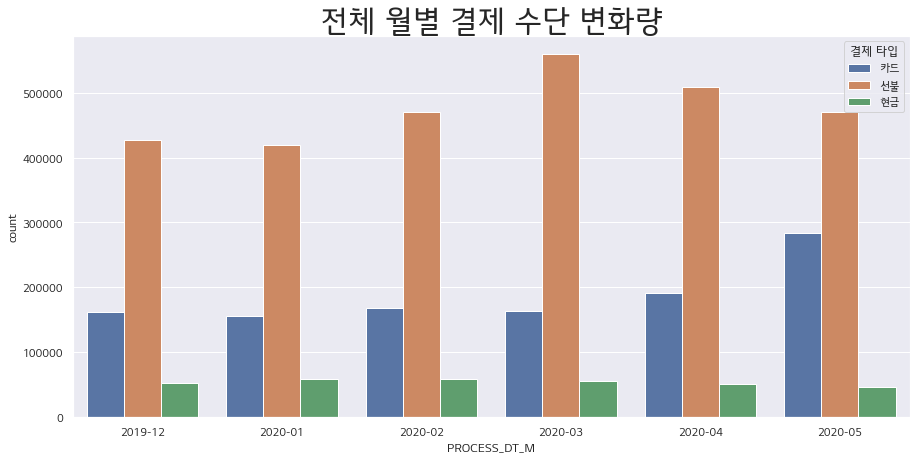

In [21]:
plt.figure(figsize = [15,7])
plt.title('전체 월별 결제 수단 변화량', size = 30)
ax = sns.countplot(data=Dlvr, x='PROCESS_DT_M',hue='SETLE_KND_VALUE')
h,l = ax.get_legend_handles_labels()
labels=["카드", "선불", "현금"]
ax.legend(h,labels,title="결제 타입",loc='upper right')
plt.show()

# 1.카드,2.선불,3.현금,4.현금->카드,5.카드->현금,6.카드->선불,7.선금->카드,8.선불->현금,9.현금->선불,10.후불.11.-

**다음은 배달 서비스 금액 분석입니다.**

**배달 서비스 금액의 Range를 확인하기 위해 BoxPlot을 이용하여 전체데이터(서울,경기도) 확인 결과 최대치가 100000을 넘어거는 금액도 있을만큼**

**전체적으로 이상치들이 많이 존재하여 Box가 잘 보이지가 않습니다.**


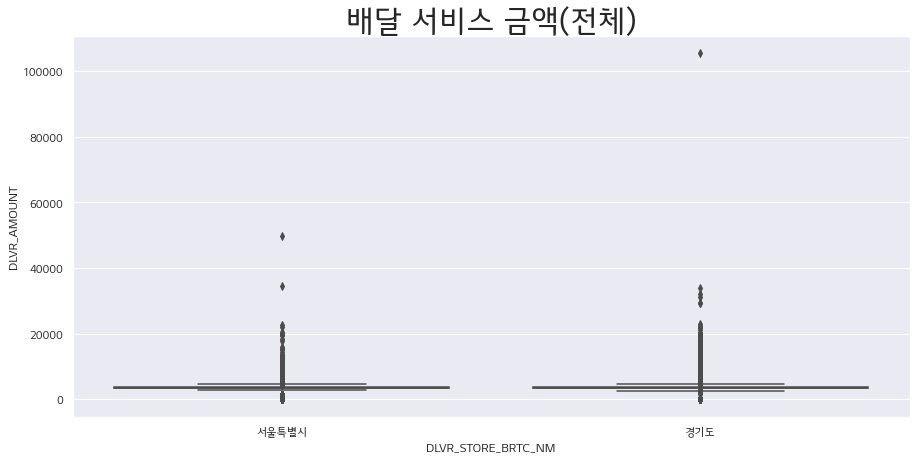

In [22]:
# Box Plot
# DLVR_STORE_BRTC_NM : 지역 , DLVR_AMOUNT : 배달 금액
plt.figure(figsize = [15,7])
plt.title('배달 서비스 금액(전체)', size = 30)
sns.boxplot(x=Dlvr[Dlvr['GOODS_AMOUNT'] !=0]['DLVR_STORE_BRTC_NM'] , y='DLVR_AMOUNT',data=Dlvr)
plt.show()

**BOX를 확인하기 위해 배달 서비스 금액이 6000원 이하인 데이터로 필터링 하여 다시 시각화 해봤습니다.**

**BoxPlot 확인 결과 배달 서비스 금액 3000~4000 구간에 형성되어 있고 BOX 구간을 벗어나는 이상치 구간이 많음을 확인하였습니다.**

**배달서비스 금액이 몇 만원 한다는 것이 이상하여 데이콘에 문의해 봤는데, 아래와 같은 답변을 받았습니다.**


**[데이콘 답변]**

**배달금액은 회사에서 설정한 [구간요금]과 [부가세]를 포함하여 계산되었습니다.**

**해당 상점이 소속된 회사에서 설정한 [구간요금]은 (기본요금 + 일정거리마다 일정 요금)이 추가 되는 방식입니다.**

**(단, 구간요금이 설정된 최대요금 초과시 최대요금으로 부과)**

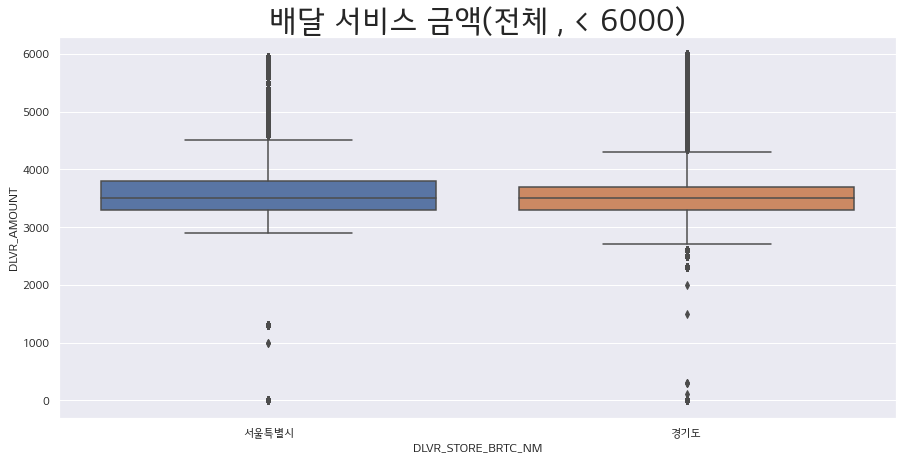

In [23]:
# Box Plot
# DLVR_STORE_BRTC_NM : 지역 , DLVR_AMOUNT : 배달 금액
plt.figure(figsize = [15,7])
plt.title('배달 서비스 금액(전체 , < 6000)', size = 30)
sns.boxplot(x=Dlvr[Dlvr['GOODS_AMOUNT'] !=0]['DLVR_STORE_BRTC_NM'] , y=Dlvr[Dlvr['DLVR_AMOUNT'] < 6000]['DLVR_AMOUNT'],data=Dlvr)
plt.show()

**다음은 상품 금액 분석입니다.**

**배달 서비스 금액과 마찬가지로 BoxPlot을 이용하여 전체데이터(서울,경기도)를 시각화 하였으나,**

**역시 이상치가 많음을 확인하였습니다.**

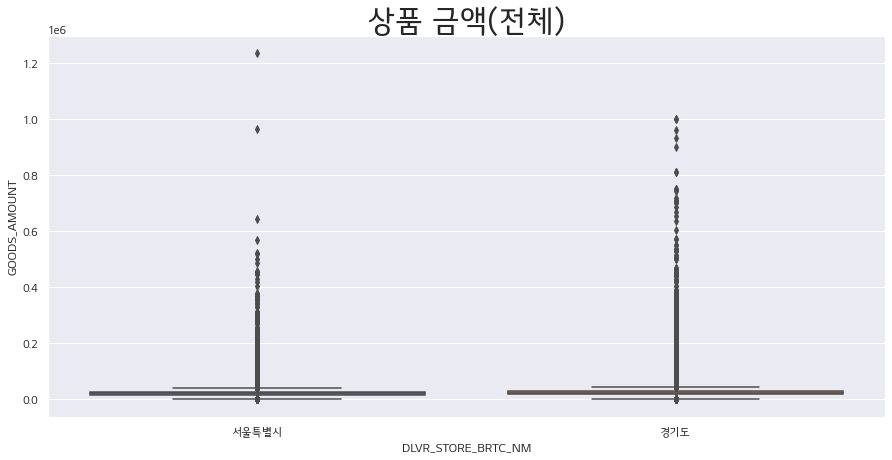

In [24]:
# Box Plot
# DLVR_STORE_BRTC_NM : 지역 , GOODS_AMOUNT : 상품 금액
plt.figure(figsize = [15,7])
plt.title('상품 금액(전체)', size = 30)
sns.boxplot(x=Dlvr[Dlvr['GOODS_AMOUNT'] !=0]['DLVR_STORE_BRTC_NM'], y='GOODS_AMOUNT',data=Dlvr)
plt.show()

**BOX를 확인하기 위해 상품 금액이 100000 이하인 데이터를 필터링하여 다시 시각화 하였습니다.**

**확인결과 서울,경기도 모두 20000 내외에서 BOX가 형성됨을 확인하였습니다.**

**평균적인 배달 상품 금액 20000 내외이나 데이터가 방대한 만큼 평균 금액을 벗어나는 이상치들이 많이 존재하는 것으로 생각됩니다.**

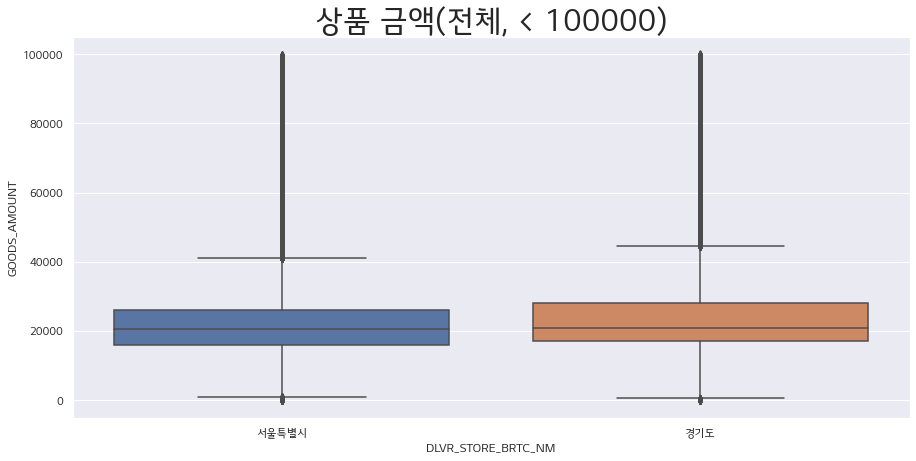

In [25]:
# Box Plot
# DLVR_STORE_BRTC_NM : 지역 , GOODS_AMOUNT : 상품 금액
plt.figure(figsize = [15,7])
plt.title('상품 금액(전체, < 100000)', size = 30)
sns.boxplot(x=Dlvr[Dlvr['GOODS_AMOUNT'] !=0]['DLVR_STORE_BRTC_NM'], y=Dlvr[Dlvr['GOODS_AMOUNT'] < 100000]['GOODS_AMOUNT'],data=Dlvr)
plt.show()

**서울시 구별로 배달 서비스 금액을 다시 세분화하여 분석해 보았습니다.**

**전체 데이터와 마찬가지로 이상치들이 많아 Box가 잘 보이지 않습니다.**

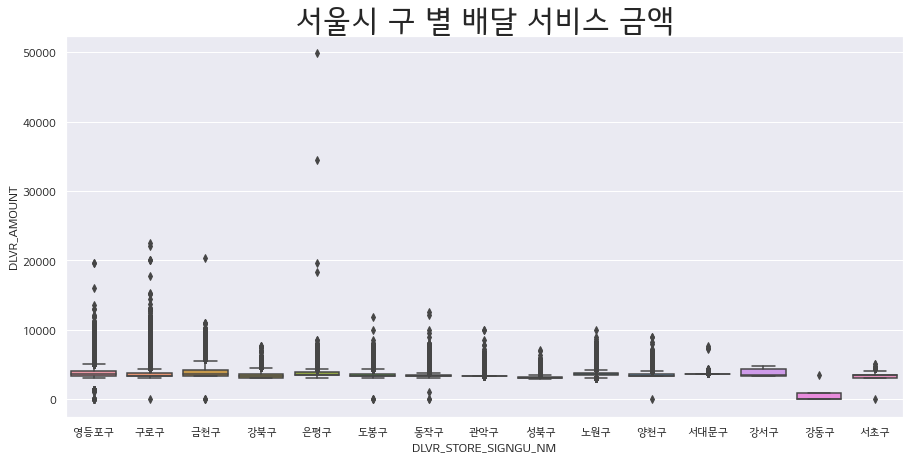

In [26]:
# 서울시 배달 서비스 금액 Box Plot
# DLVR_STORE_BRTC_NM : 지역 , DLVR_AMOUNT : 배달 금액
plt.figure(figsize = [15,7])
plt.title('서울시 구 별 배달 서비스 금액', size = 30)
sns.boxplot(x=Dlvr_seoul[(Dlvr_seoul['GOODS_AMOUNT'] !=0)]['DLVR_STORE_SIGNGU_NM'] , y='DLVR_AMOUNT',data=Dlvr_seoul)
plt.show()

**BOX를 확인하기 위해 서비스금액이 10000이하인 데이터로 필터링 하였고,**


**전체적으로 4000내외에서 BOX가 형성되어 있는 반면 강동구는 더 밑에 위치해 있는 것을 확인하였는데,**

**강동구의 경우 데이터가 적기도 하고 그 중에 GOODS_AMOUNT가 0인 데이터가 많아서(배달 플랫폼 중 금액 연동이 안되는 업체 데이터)**

**아래와 같이 시각화된 것으로 확인됩니다.**

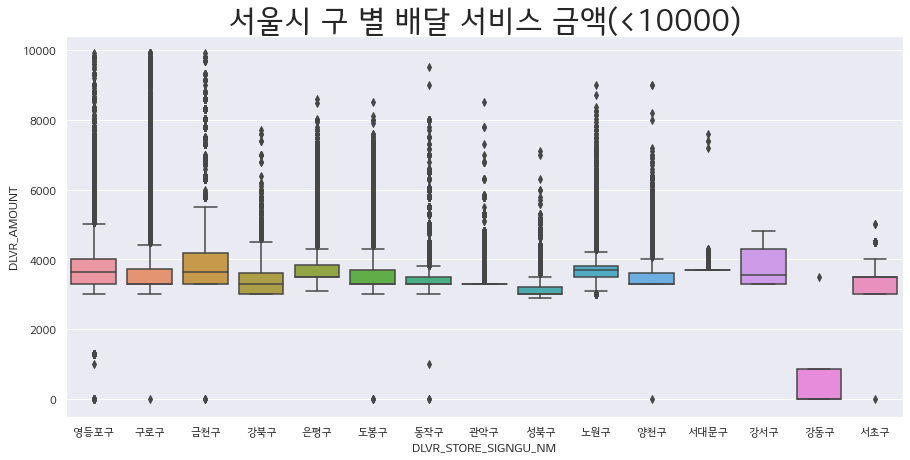

In [27]:
# 서울시 배달 서비스 금액 Box Plot
# DLVR_STORE_BRTC_NM : 지역 , DLVR_AMOUNT : 배달 금액
plt.figure(figsize = [15,7])
plt.title('서울시 구 별 배달 서비스 금액(<10000)', size = 30)
sns.boxplot(x=Dlvr_seoul[(Dlvr_seoul['GOODS_AMOUNT'] !=0)]['DLVR_STORE_SIGNGU_NM'] , y=Dlvr_seoul[Dlvr_seoul['DLVR_AMOUNT']<10000]['DLVR_AMOUNT'],data=Dlvr_seoul)
plt.show()

In [28]:
Dlvr_seoul[(Dlvr_seoul['DLVR_STORE_SIGNGU_NM'] == '강동구') & (Dlvr_seoul['GOODS_AMOUNT'] == 0)]

,SN,PROCESS_DT,DLVR_REQUST_ENTRPS_ID,DLVR_REQUST_STTUS_VALUE,DLVR_RCEPT_ENTRPS_ID,DLVR_STORE_ID,DLVR_STORE_INDUTY_NM,DLVR_STORE_LEGALDONG_CODE,DLVR_STORE_BRTC_NM,DLVR_STORE_SIGNGU_NM,DLVR_STORE_LEGALDONG_NM,DLVR_STORE_LI_NM,DLVR_STORE_ADSTRD_CODE,DLVR_STORE_RDNMADR_CODE,DLVR_DSTN_LEGALDONG_CODE,DLVR_DSTN_BRTC_NM,DLVR_DSTN_SIGNGU_NM,DLVR_DSTN_LEGALDONG_NM,DLVR_DSTN_LI_NM,DLVR_DSTN_ADSTRD_CODE,DLVR_DSTN_RDNMADR_CODE,DLVR_MAN_ID,DLVR_AMOUNT,CALL_RLAY_FEE_AMOUNT,GOODS_AMOUNT,SETLE_KND_VALUE,SETLE_CARD_NM,DLVR_RCEPT_TIME,DLVR_CARALC_TIME,DLVR_RECPT_TIME,DLVR_COMPT_TIME,DLVR_CANCL_TIME,PROCESS_DT_M
1215479,5463439,2020-01-29,C000324,1,C000472,S0039910,심부름,1174010700,서울특별시,강동구,암사동,\N,1174058000,117403123023,1174010700,서울특별시,강동구,암사동,\N,1174058000,117403123023,D0008197,4500,500,0,3,NaN,2020-01-29 10:12:13,2020-01-29 10:12:37,2020-01-29 10:15:47,2020-01-29 10:19:02,\N,2020-01
1215574,5463583,2020-01-29,C000324,1,C000472,S0039913,심부름,1174010900,서울특별시,강동구,천호동,\N,1174061000,117403124005,1174010800,서울특별시,강동구,성내동,\N,1174066000,117402123001,D0008197,5800,500,0,3,NaN,2020-01-29 11:34:39,2020-01-29 11:34:55,2020-01-29 11:42:04,2020-01-29 11:51:34,\N,2020-01
1215784,5463903,2020-01-29,C000324,1,C000472,S0039913,심부름,1174010900,서울특별시,강동구,천호동,\N,1174061000,117403124005,1174010900,서울특별시,강동구,천호동,\N,1174061000,117403123023,D0008197,4500,500,0,3,NaN,2020-01-29 09:43:57,2020-01-29 09:45:49,2020-01-29 09:46:02,2020-01-29 09:57:04,\N,2020-01
1215856,5464018,2020-01-29,C000324,1,C000472,S0039897,심부름,1174010900,서울특별시,강동구,천호동,\N,1174061000,117403124005,1174010900,서울특별시,강동구,천호동,\N,1174061000,117403124009,D0008197,4500,500,0,3,NaN,2020-01-29 11:41:55,2020-01-29 11:43:38,2020-01-29 11:43:49,2020-01-29 11:46:29,\N,2020-01
1216166,5464473,2020-01-29,C000324,1,C000472,S0039913,심부름,1174010900,서울특별시,강동구,천호동,\N,1174061000,117403124005,1174011000,서울특별시,강동구,강일동,\N,1174051500,117404172446,D0008197,11000,500,0,3,NaN,2020-01-29 10:31:56,2020-01-29 10:32:13,2020-01-29 10:40:52,2020-01-29 11:00:59,\N,2020-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4198365,7602230,2020-03-28,C000324,1,C000478,S0039912,심부름,1174010900,서울특별시,강동구,천호동,\N,1174061000,1.17403E+11,1174010600,서울특별시,강동구,둔촌동,\N,1174070000,1.17402E+11,D0009016,6710,500,0,3,NaN,2020-03-28 11:00,2020-03-28 12:00,\N,2020-03-28 12:00,\N,2020-03
4200552,7605538,2020-03-28,C000324,1,C000478,S0039912,심부름,1174010900,서울특별시,강동구,천호동,\N,1174061000,1.17403E+11,1174011000,서울특별시,강동구,강일동,\N,1174051500,1.17403E+11,D0009016,9900,500,0,3,NaN,2020-03-28 12:08,2020-03-28 12:10,\N,2020-03-28 12:46,\N,2020-03
4276998,7720874,2020-03-31,C000324,1,C000478,S0039912,심부름,1174010900,서울특별시,강동구,천호동,\N,1174061000,1.17403E+11,1174010900,서울특별시,강동구,천호동,\N,1174062000,1.17402E+11,D0009016,5720,500,0,3,NaN,2020-03-31 12:34,2020-03-31 12:35,\N,2020-03-31 12:49,\N,2020-03
4281154,7727099,2020-03-31,C000324,2,C000472,S0039912,심부름,1174010900,서울특별시,강동구,천호동,\N,1174061000,1.17403E+11,1174010900,서울특별시,강동구,천호동,\N,1174062000,1.17402E+11,D0009641,5720,500,0,3,NaN,2020-03-31 16:02,2020-03-31 16:08,\N,\N,2020-03-31 16:12,2020-03


**다음은 서울시 구 별 상품 금액 분석입니다**

**배달서비스 금액과 마찬가지로 이상치들이 많이 존재하여 BOX가 잘 보이지 않습니다.**

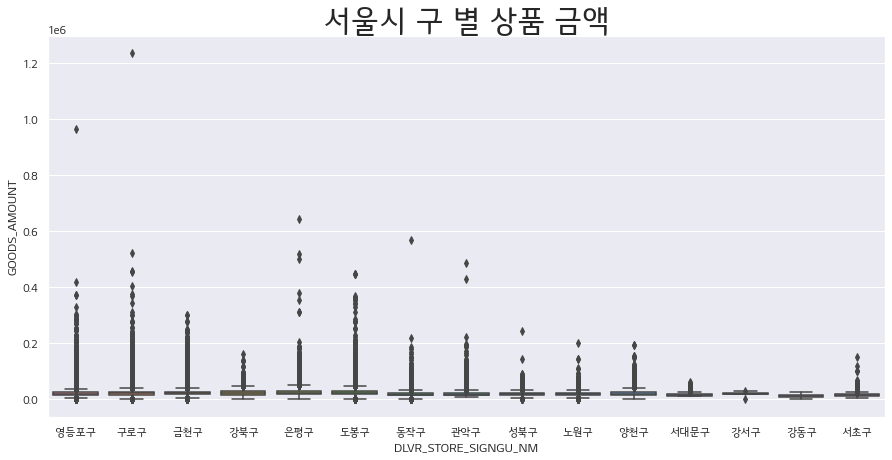

In [29]:
# 서울시 구 별 상품 금액 Box Plot
# DLVR_STORE_BRTC_NM : 지역 , DLVR_AMOUNT : 배달 금액
plt.figure(figsize = [15,7])
plt.title('서울시 구 별 상품 금액', size = 30)
sns.boxplot(x=Dlvr_seoul[(Dlvr_seoul['GOODS_AMOUNT'] !=0)]['DLVR_STORE_SIGNGU_NM'] , y='GOODS_AMOUNT',data=Dlvr_seoul)
plt.show()

**BOX를 확인하기 위해 상품금액이 10만원 이하인 금액으로 필터링하였고,**

**Boxplot 확인 결과 약 2만원 내외에서 Box가 형성되고 있음을 확인하였습니다.**

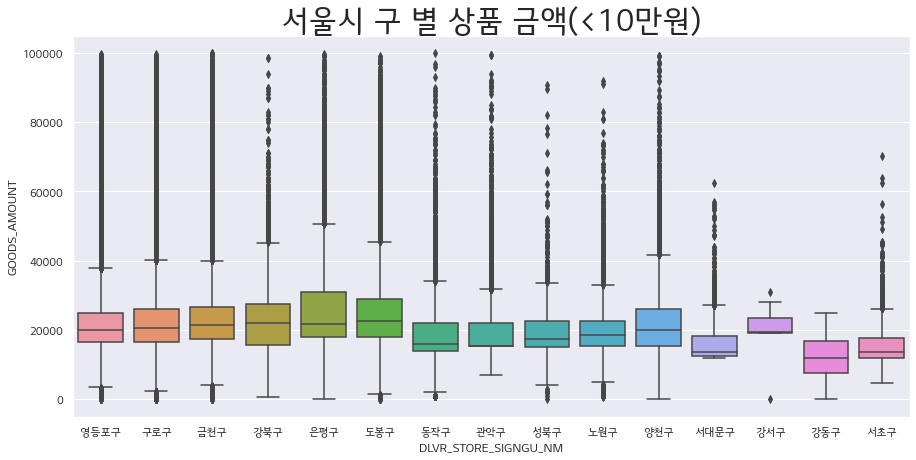

In [30]:
# 서울시 구 별 상품 금액 Box Plot
# DLVR_STORE_BRTC_NM : 지역 , DLVR_AMOUNT : 배달 금액
plt.figure(figsize = [15,7])
plt.title('서울시 구 별 상품 금액(<10만원)', size = 30)
sns.boxplot(x=Dlvr_seoul[(Dlvr_seoul['GOODS_AMOUNT'] !=0)]['DLVR_STORE_SIGNGU_NM'] , y=Dlvr_seoul[Dlvr_seoul['GOODS_AMOUNT']<100000]['GOODS_AMOUNT'],data=Dlvr_seoul)
plt.show()

**Boxplot을 통하여 배달 서비스 금액과 상품 금액을 분석 중 이상치가 많은 것이 특이하다고 생각되어 두 변수간의 상관관계가 있는지 확인해 보았습니다.**

**결과는 아래와 같으며 배달 서비스 금액/상품 금액이 상관관계가 있는 것처럼 보여지지는 않았습니다.**


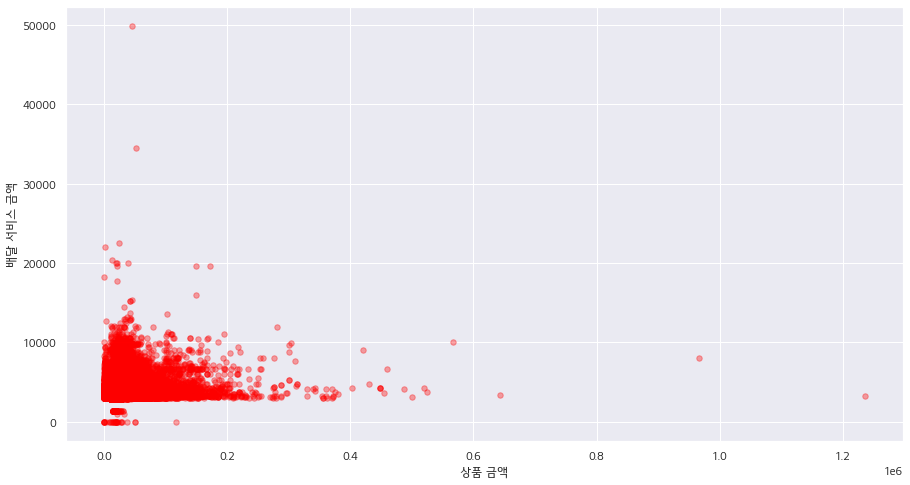

In [31]:
plt.figure(figsize = [15,8])
plt.xlabel('상품 금액')
plt.ylabel('배달 서비스 금액')
plt.scatter(x=Dlvr_seoul[(Dlvr_seoul['GOODS_AMOUNT'] !=0)]['GOODS_AMOUNT'],
                       y =Dlvr_seoul[(Dlvr_seoul['GOODS_AMOUNT'] !=0)]['DLVR_AMOUNT'],
                       s=30 , c='red',alpha=0.35)  # s : 점의 크기 , c = 점의 색상
plt.show()

**다음은 배달 업종 분석입니다.**

In [32]:
# 서울,경기도 배달 업종 수
Dlvr['DLVR_STORE_INDUTY_NM'].value_counts()

치킨        962851
한식        537266
분식        494233
족발/보쌈     367846
카페/디저트    345708
패스트푸드     309206
돈까스/일식    226834
피자        224504
야식        190211
찜탕        166300
중식        133655
아시안/양식    104130
회          96165
배달전문업체     83810
도시락        45869
심부름         7683
Name: DLVR_STORE_INDUTY_NM, dtype: int64

In [33]:
# 서울시 배달 업종 수
Dlvr_seoul['DLVR_STORE_INDUTY_NM'].value_counts()

치킨        269061
분식        135733
패스트푸드     108031
카페/디저트     86202
한식         77326
족발/보쌈      75518
피자         60361
야식         38570
아시안/양식     29198
중식         25743
돈까스/일식     25209
회          16914
찜탕         15033
배달전문업체     10218
도시락         5248
심부름         2525
Name: DLVR_STORE_INDUTY_NM, dtype: int64

**서울시 배달 업종을 시각화한 결과 치킨이 압도적으로 많은 것을 확인하였으며,**

**그 뒤로 분식,패스트푸드,족발/보쌈 같은 음식들이 인기가 많다는 것을 확인하였습니다.**

<AxesSubplot:title={'center':'서울시 배달 업종'}, xlabel='DLVR_STORE_INDUTY_NM', ylabel='count'>

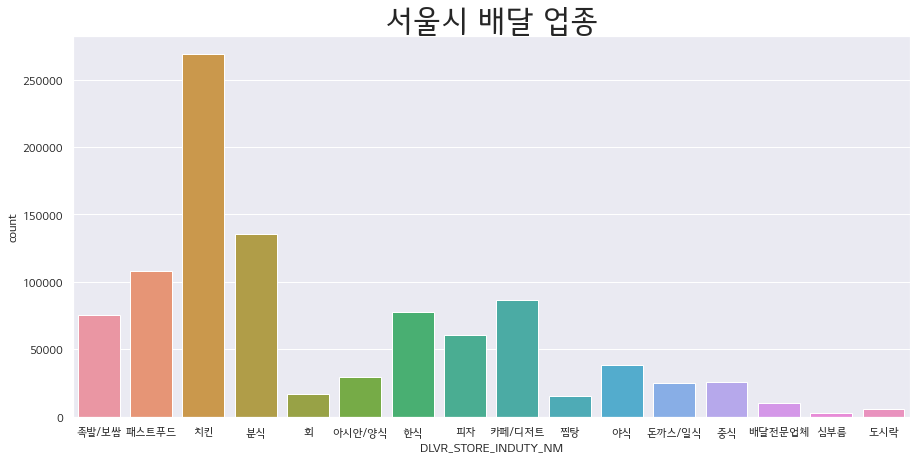

In [34]:
plt.figure(figsize = [15,7])
plt.title('서울시 배달 업종', size = 30)
sns.countplot(data=Dlvr_seoul, x='DLVR_STORE_INDUTY_NM')

**초반에 확인한 서울시 데이터 중 '구로구'의 데이터가 많았던 점을 상기하여, 구로구 데이터를 좀 더 집중적으로 분석해 봤습니다.**

In [35]:
Dlvr_seoul[Dlvr_seoul['DLVR_STORE_SIGNGU_NM'] =='구로구']

,SN,PROCESS_DT,DLVR_REQUST_ENTRPS_ID,DLVR_REQUST_STTUS_VALUE,DLVR_RCEPT_ENTRPS_ID,DLVR_STORE_ID,DLVR_STORE_INDUTY_NM,DLVR_STORE_LEGALDONG_CODE,DLVR_STORE_BRTC_NM,DLVR_STORE_SIGNGU_NM,DLVR_STORE_LEGALDONG_NM,DLVR_STORE_LI_NM,DLVR_STORE_ADSTRD_CODE,DLVR_STORE_RDNMADR_CODE,DLVR_DSTN_LEGALDONG_CODE,DLVR_DSTN_BRTC_NM,DLVR_DSTN_SIGNGU_NM,DLVR_DSTN_LEGALDONG_NM,DLVR_DSTN_LI_NM,DLVR_DSTN_ADSTRD_CODE,DLVR_DSTN_RDNMADR_CODE,DLVR_MAN_ID,DLVR_AMOUNT,CALL_RLAY_FEE_AMOUNT,GOODS_AMOUNT,SETLE_KND_VALUE,SETLE_CARD_NM,DLVR_RCEPT_TIME,DLVR_CARALC_TIME,DLVR_RECPT_TIME,DLVR_COMPT_TIME,DLVR_CANCL_TIME,PROCESS_DT_M
9,3486946,2019-12-01,C000049,1,C000049,S0022458,패스트푸드,1153010800,서울특별시,구로구,오류동,\N,1153077000,115304148076,1153010900,서울특별시,구로구,궁동,\N,1153079000,115304148440,D0004578,3000,400,11500,2,NaN,2019-12-01 20:22:17,2019-12-01 20:37:16,2019-12-01 20:44:49,2019-12-01 21:04:42,\N,2019-12
17,3486960,2019-12-01,C000049,1,C000049,S0022440,패스트푸드,1153010600,서울특별시,구로구,고척동,\N,1153072000,115304148103,1153010600,서울특별시,구로구,고척동,\N,1153073000,115304148179,D0004578,3000,400,13600,2,NaN,2019-12-01 22:38:54,2019-12-01 22:40:24,2019-12-01 22:49:55,2019-12-01 22:55:59,\N,2019-12
19,3486964,2019-12-01,C000049,1,C000049,S0000200,분식,1153010600,서울특별시,구로구,고척동,\N,1153072000,115304148103,1153010200,서울특별시,구로구,구로동,\N,1153052000,115304148289,D0005434,3300,300,15000,2,NaN,2019-12-01 18:52:02,2019-12-01 19:12:08,2019-12-01 19:22:07,2019-12-01 19:43:26,\N,2019-12
30,3486978,2019-12-01,C000049,1,C000049,S0000267,회,1153010600,서울특별시,구로구,고척동,\N,1153072000,115303005068,1153010700,서울특별시,구로구,개봉동,\N,1153076000,115304148053,D0004486,3300,300,26000,1,승인:삼성카드사,2019-12-01 19:06:12,2019-12-01 19:52:00,2019-12-01 19:57:03,2019-12-01 20:05:32,\N,2019-12
34,3486982,2019-12-01,C000049,1,C000237,S0000135,치킨,1153010700,서울특별시,구로구,개봉동,\N,1153075000,115304148300,1153010200,서울특별시,구로구,구로동,\N,1153052000,115304148289,D0004604,4300,400,17900,2,NaN,2019-12-01 23:11:38,2019-12-01 23:13:18,2019-12-01 23:25:19,2019-12-01 23:33:09,\N,2019-12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4296197,7750431,2020-03-31,C000049,1,C000049,S0022444,한식,1153010600,서울특별시,구로구,고척동,\N,1153073000,1.15304E+11,1153010600,서울특별시,구로구,고척동,\N,1153072000,\N,D0004511,3300,300,18900,2,NaN,2020-03-31 22:19,2020-03-31 22:20,2020-03-31 22:40,2020-03-31 22:45,\N,2020-03
4296211,7750456,2020-03-31,C000049,1,C000049,S0022440,패스트푸드,1153010600,서울특별시,구로구,고척동,\N,1153072000,1.15304E+11,1153010600,서울특별시,구로구,고척동,\N,1153073000,1.15304E+11,D0006466,3300,300,14500,3,NaN,2020-03-31 23:53,2020-03-31 23:53,2020-04-01 0:02,2020-04-01 0:08,\N,2020-03
4296217,7750468,2020-03-31,C000049,1,C000049,S0022440,패스트푸드,1153010600,서울특별시,구로구,고척동,\N,1153072000,1.15304E+11,1153010800,서울특별시,구로구,오류동,\N,1153077000,1.15304E+11,D0009452,3850,400,0,2,NaN,2020-03-31 23:38,2020-03-31 23:39,2020-03-31 23:46,2020-03-31 23:55,\N,2020-03
4296220,7750472,2020-03-31,C000049,1,C000049,S0022440,패스트푸드,1153010600,서울특별시,구로구,고척동,\N,1153072000,1.15304E+11,1153010700,서울특별시,구로구,개봉동,\N,1153075000,1.15304E+11,D0006560,3410,200,11000,2,NaN,2020-03-31 23:16,2020-03-31 23:24,2020-03-31 23:27,2020-03-31 23:36,\N,2020-03


**구로구 업종별 배달 수 확인 결과 서울 데이터와 유사하게 치킨이 가장 많고 그 다음으로 패스트푸드, 분식이 인기가 많다는 것을 확인하였습니다.**

<AxesSubplot:title={'center':'서울 구로구 업종별 배달 수'}, xlabel='DLVR_STORE_INDUTY_NM', ylabel='count'>

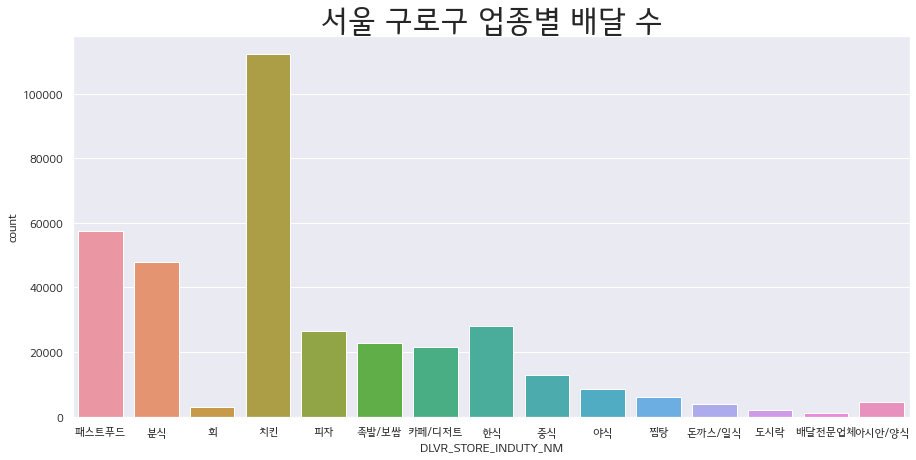

In [36]:
plt.figure(figsize = [15,7])
plt.title('서울 구로구 업종별 배달 수', size = 30)
sns.countplot(data=Dlvr_seoul[Dlvr_seoul['DLVR_STORE_SIGNGU_NM'] =='구로구'], x='DLVR_STORE_INDUTY_NM')

**구로구 업종별 배달수 Top10을 PiePlot을 이용한 비율로 나타내 보았습니다.** 

In [37]:
seoul_nm = Dlvr_seoul[Dlvr_seoul['DLVR_STORE_SIGNGU_NM'] == '구로구']['DLVR_STORE_INDUTY_NM'].value_counts()[:10]
print(seoul_nm.index)
print(seoul_nm.values)

Index(['치킨', '패스트푸드', '분식', '한식', '피자', '족발/보쌈', '카페/디저트', '중식', '야식', '찜탕'], dtype='object')
[112199  57552  47790  28018  26376  22740  21486  12929   8465   6043]


**Top 3인 치킨,패스트푸드,분식을 합치면 약 63.31% 로 이 3개 업종의 인기가 굉장히 높다는 것을 알 수 있었습니다.**

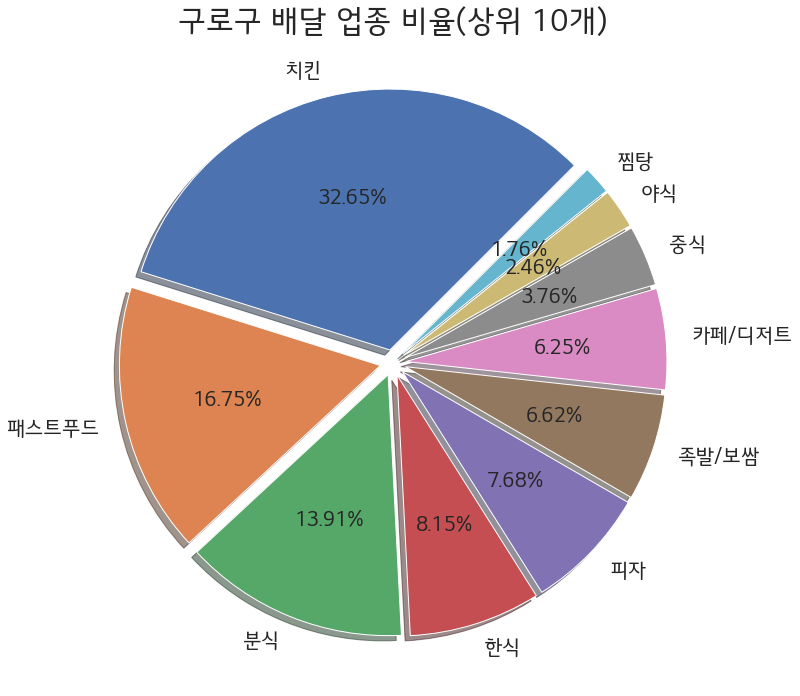

In [40]:
seoul_values = seoul_nm.values
label = seoul_nm.index

explode = [0.05 for _ in range(len(label))]


fig = plt.figure(figsize=(12,12)) ## 캔버스 생성
fig.set_facecolor('white') ## 캔버스 색상 하얀색
 
ax = fig.add_subplot() ## 프래임 생성

ax.pie(seoul_values,
        labels = label,
        autopct='%1.2f%%', shadow=True,
        startangle=45,
        explode = explode,
        textprops={'fontsize': 20}
        )

plt.title('구로구 배달 업종 비율(상위 10개)', size = 30)
plt.show()

**아래 부터는 업종/지역별 창업/폐업 유추 데이터를 통해 EDA를 진행하였습니다.** 

# 3. EDA - StartupOrClosing_Region_ver2.csv

In [41]:
Region.head(10)

,INDEX,DATE,INDUTY_NM,BRTC_NM,SIGUNGU_NM,EMD,LA_DCMLPOINT_VALUE,LO_DCMLPOINT_VALUE,DIVISION
0,1,20200101,부동산,경기,용인시 처인구,봉명리,37.109***,127.131***,1
1,2,20200101,토목공학엔지니어링,인천,서구,오류동,37.598***,126.613***,1
2,3,20200101,한식,강원,영월군 영월읍,영흥리,37.187***,128.473***,1
3,4,20200101,보일러판매,대전,중구,목동,36.336***,127.403***,1
4,5,20200101,돼지국밥,경남,창원시 마산합포구,현동,35.147***,128.557***,1
5,6,20200101,레저용품대여,전북,군산시,비응도동,35.939***,126.529***,1
6,7,20200102,햄버거,경기,용인시 처인구,완장리,37.156***,127.173***,1
7,8,20200102,악기판매,경기,안양시 만안구,안양1동,37.407***,126.914***,1
8,9,20200102,지방지,강원,삼척시,정상동,37.434***,129.177***,1
9,10,20200102,꽃집.꽃배달,대전,서구,탄방동,36.348***,127.387***,1


In [42]:
Region.tail(10)

,INDEX,DATE,INDUTY_NM,BRTC_NM,SIGUNGU_NM,EMD,LA_DCMLPOINT_VALUE,LO_DCMLPOINT_VALUE,DIVISION
67247,67248,20200630,한식,서울,성동구,행당동,37.559***,127.040***,0
67248,67249,20200630,카페,대전,서구,관저동,36.306***,127.343***,0
67249,67250,20200630,피부과,대구,수성구,두산동,35.854***,128.506***,0
67250,67251,20200630,비주거용건물임대(종합),부산,남구,대연동,35.147***,129.061***,0
67251,67252,20200630,프랜차이즈,서울,강남구,개포동,37.478***,127.047***,0
67252,67253,20200630,부동산,경남,김해시,삼문동,35.190***,128.810***,0
67253,67254,20200630,호프,경기,용인시 기흥구,공세동,37.240***,127.108***,0
67254,67255,20200630,떡볶이,경기,성남시 분당구,야탑동,37.412***,127.129***,0
67255,67256,20200630,악기제조(종합),인천,중구,관동3가,37.471***,126.624***,0
67256,67257,20200630,예식장,서울,강동구,암사동,37.550***,127.128***,0


In [43]:
Region.shape

(67257, 9)

In [44]:
Region.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 67257 entries, 0 to 67256
Data columns (total 9 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   INDEX               67257 non-null  int64 
 1   DATE                67257 non-null  int64 
 2   INDUTY_NM           67257 non-null  object
 3   BRTC_NM             67257 non-null  object
 4   SIGUNGU_NM          67257 non-null  object
 5   EMD                 67257 non-null  object
 6   LA_DCMLPOINT_VALUE  67257 non-null  object
 7   LO_DCMLPOINT_VALUE  67257 non-null  object
 8   DIVISION            67257 non-null  int64 
dtypes: int64(3), object(6)
memory usage: 4.6+ MB


In [45]:
Region.dtypes

INDEX                  int64
DATE                   int64
INDUTY_NM             object
BRTC_NM               object
SIGUNGU_NM            object
EMD                   object
LA_DCMLPOINT_VALUE    object
LO_DCMLPOINT_VALUE    object
DIVISION               int64
dtype: object

In [46]:
Region.describe()

,INDEX,DATE,DIVISION
count,67257.000000,6.725700e+04,67257.000000
mean,33629.000000,2.020054e+07,0.025633
std,19415.567864,4.949166e+01,0.158039
min,1.000000,2.020010e+07,0.000000
25%,16815.000000,2.020053e+07,0.000000
50%,33629.000000,2.020053e+07,0.000000
75%,50443.000000,2.020053e+07,0.000000
max,67257.000000,2.020063e+07,1.000000


## 3-2. 전처리

**위/경도 값을 시각화 하기 위해 Masking되어 있는 부분에 대해 전처리 하였습니다.**

In [47]:
# 위/경도 전처리 
# 1.위/경도 값에서 마스킹된 *는 제거 
Region['LA_DCMLPOINT_VALUE'] = Region['LA_DCMLPOINT_VALUE'].str.replace('*','')
Region['LO_DCMLPOINT_VALUE'] = Region['LO_DCMLPOINT_VALUE'].str.replace('*','')

# 2. Type을 object -> float로 변경
Region['LA_DCMLPOINT_VALUE'] = Region['LA_DCMLPOINT_VALUE'].astype('float')
Region['LO_DCMLPOINT_VALUE'] = Region['LO_DCMLPOINT_VALUE'].astype('float')

**전체 데이터를 확인 결과 창업 데이터(0) 보다는 폐업 데이터(1)가 압도적으로 많았습니다.**

In [48]:
Region['DIVISION'].value_counts()

0    65533
1     1724
Name: DIVISION, dtype: int64

In [49]:
# 창업/폐업이 가장 활발하게 이루어진 지역은?
Region['BRTC_NM'].value_counts()

경기      12966
서울      10913
경남       5097
경북       4413
부산       4319
충남       3509
전남       3345
전북       3164
강원       3009
대구       2934
충북       2816
인천       2616
광주       2273
대전       2205
울산       1416
제주       1347
경기도       665
세종        248
전라남도        2
Name: BRTC_NM, dtype: int64

**창업/폐업이 가장 활발하게 이루어진 지역을 시각화한 결과 경기지역과 서울이 가장 많은 것을 확인하였습니다.**

<AxesSubplot:xlabel='BRTC_NM', ylabel='count'>

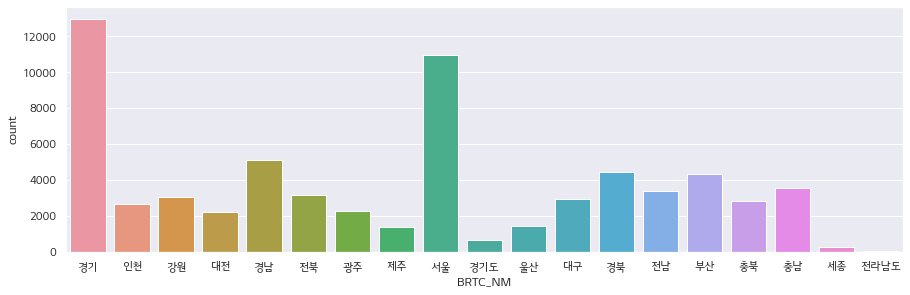

In [50]:
plt.figure(figsize = [15,4.5])
sns.countplot(data=Region, x='BRTC_NM')

**countplot의 범주를 사용하여 전국 창업/폐업 상태를 다시 시각화해 봤습니다.**

**위에서 언급한것 처럼 창업 데이터 보다는 폐업 데이터가 압도적으로 많은 것이 확인되며,**

**그 수가 적긴 하지만 창업 지역도 경기지역과 서울지역이 많습니다.**

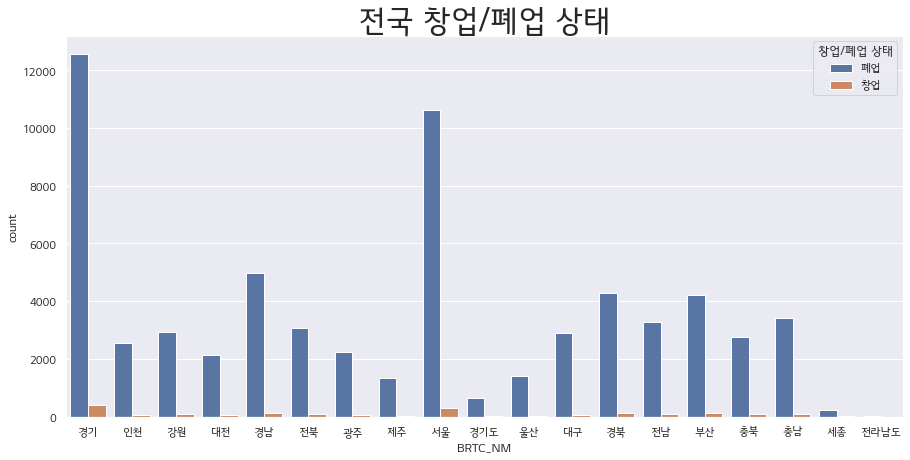

In [51]:
plt.figure(figsize = [15,7])
plt.title('전국 창업/폐업 상태', size = 30)
ax = sns.countplot(data=Region, x='BRTC_NM',hue='DIVISION')
h,l = ax.get_legend_handles_labels()
labels=["폐업", "창업"]
ax.legend(h,labels,title="창업/폐업 상태",loc='upper right')
plt.show()


In [52]:
# 경기지역에서 창업/폐업이 이루어진 시/군/면 
Region[Region['BRTC_NM'] == '경기']['SIGUNGU_NM'].value_counts()

시흥시        642
안산시 단원구    545
성남시 분당구    509
안양시 동안구    405
평택시        398
          ... 
연천군 장남면      1
양평군 단월면      1
연천군 백학면      1
연천군 왕징면      1
연천군 신서면      1
Name: SIGUNGU_NM, Length: 172, dtype: int64

In [53]:
# 서울지역에서 창업/폐업이 이루이진 구
Region[Region['BRTC_NM'] == '서울']['SIGUNGU_NM'].value_counts()

강남구     1360
서초구      937
중구       804
영등포구     692
종로구      616
송파구      569
마포구      532
강서구      445
구로구      438
금천구      396
용산구      369
강동구      368
동대문구     363
양천구      360
성동구      317
광진구      303
은평구      279
관악구      267
노원구      265
중랑구      222
성북구      220
서대문구     216
강북구      203
동작구      194
도봉구      178
Name: SIGUNGU_NM, dtype: int64

**서울 지역 구 별 데이터를 Pieplot으로 시각화**

In [54]:
seoul_nm = Region[Region['BRTC_NM'] == '서울']['SIGUNGU_NM'].value_counts()
print(seoul_nm.index)
print(seoul_nm.values)


Index(['강남구', '서초구', '중구', '영등포구', '종로구', '송파구', '마포구', '강서구', '구로구', '금천구',
       '용산구', '강동구', '동대문구', '양천구', '성동구', '광진구', '은평구', '관악구', '노원구', '중랑구',
       '성북구', '서대문구', '강북구', '동작구', '도봉구'],
      dtype='object')
[1360  937  804  692  616  569  532  445  438  396  369  368  363  360
  317  303  279  267  265  222  220  216  203  194  178]


**Pieplot 확인 결과 강남구 데이터가 가장 많이 존재하여 그 뒤를 서초구,중구가 따르고 있습니다.**

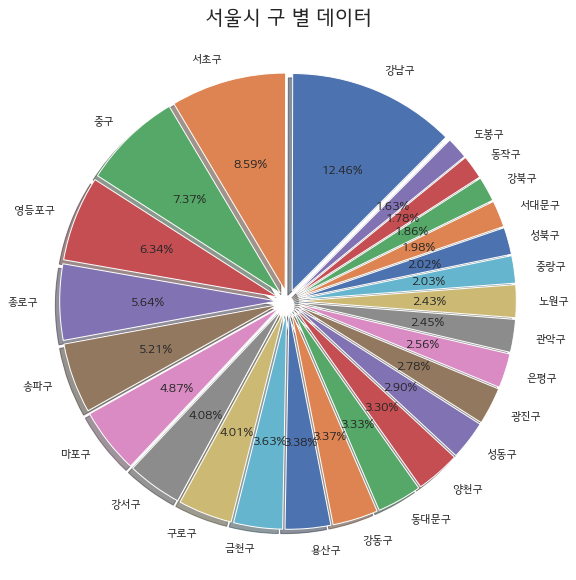

In [55]:
seoul_values = seoul_nm.values
label = seoul_nm.index
# wedgeprops={'width': 0.9, 'edgecolor': 'w', 'linewidth': 1}
explode = [0.05 for _ in range(len(label))]


fig = plt.figure(figsize=(10,10)) ## 캔버스 생성
fig.set_facecolor('white') ## 캔버스 색상 하얀색
 
ax = fig.add_subplot() ## 프래임 생성

ax.pie(seoul_values,
        labels = label,
        autopct='%1.2f%%', shadow=True,
        startangle=45,
        explode = explode,
        )

plt.title('서울시 구 별 데이터', size = 20)
plt.show()

**서울 쪽을 집중적으로 보기 위해 서울 지역을 필터링한 Data Frame 생성하였습니다.**

In [56]:
# 서울 쪽을 집중적으로 보기 위해 서울지역을 필터링한 Data Frame 생성
seoul_region = Region[(Region['BRTC_NM'] == '서울')]

**서울시를 구 별로 폐업/창업 상태 확인 하였을 때 폐업,창업 모두 강남구에서 가장 많이 발생하였습니다.(위에서 언급한 Pieplot 결과와 일치)**

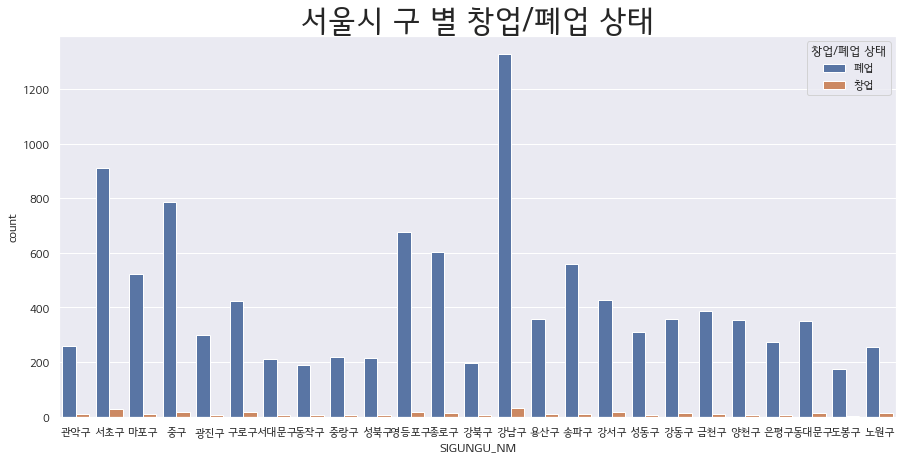

In [57]:
# 서울시 구 별 창/폐업 현황
plt.figure(figsize = [15,7])
plt.title('서울시 구 별 창업/폐업 상태', size = 30)
ax = sns.countplot(data=seoul_region, x='SIGUNGU_NM',hue='DIVISION')
h,l = ax.get_legend_handles_labels()
labels=["폐업", "창업"]
ax.legend(h,labels,title="창업/폐업 상태",loc='upper right')
plt.show()

**업종이 굉장히 많기 때문에 폐업,창업 업종 Top10을 따로 분리하여 시각화**

In [58]:
top_10_division0 = pd.DataFrame({"업종":Region[Region['DIVISION'] == 0]['INDUTY_NM'].value_counts().index[0:10],
                                 "폐업수":Region[Region['DIVISION'] == 0]['INDUTY_NM'].value_counts().values[0:10]})
top_10_division1 = pd.DataFrame({"업종":Region[Region['DIVISION'] == 1]['INDUTY_NM'].value_counts().index[0:10],
                                 "창업수":Region[Region['DIVISION'] == 1]['INDUTY_NM'].value_counts().values[0:10]})

**전국 데이터 폐업 업종 상위 10개 확인 결과 한식 업종이 가장 많은 폐업을 하였으며, 전체적으로 컨택 산업들이 많이 폐업을 하는 것으로 확인됩니다.**

**이는 코로나로 인한 거리두기 및 외출금지 등의 영향이라고 판단됩니다.**

<AxesSubplot:title={'center':'전국 폐업 업종 상위 10'}, xlabel='업종', ylabel='폐업수'>

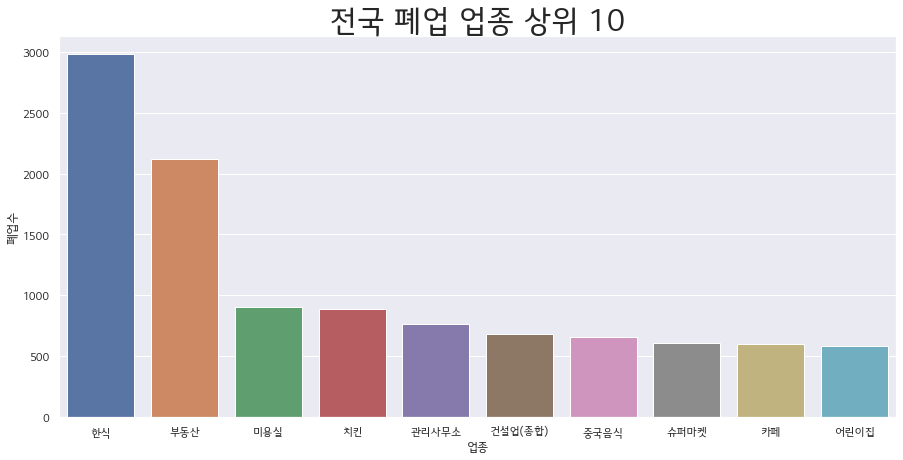

In [60]:
# 전국 폐업 업종 상위 10위
plt.figure(figsize = [15,7])
plt.title('전국 폐업 업종 상위 10', size = 30)
sns.barplot(data=top_10_division0, x='업종', y='폐업수')

**전국 데이터 창업 업종 상위 10개 확인 결과 폐업 업종과 마찬가지로 한식 업종이 가장 많은 창업을 하였습니다.**

**그러나 그 수가 150여개를 넘지 않을 정도로 폐업 대비 적은 숫자라고 생각되고,**

**한가지 특이사항은 내과,이비인후과와 같은 "병원" 들이 많이 창업을 하였습니다.**


<AxesSubplot:title={'center':'전국 창업 업종 상위 10'}, xlabel='업종', ylabel='창업수'>

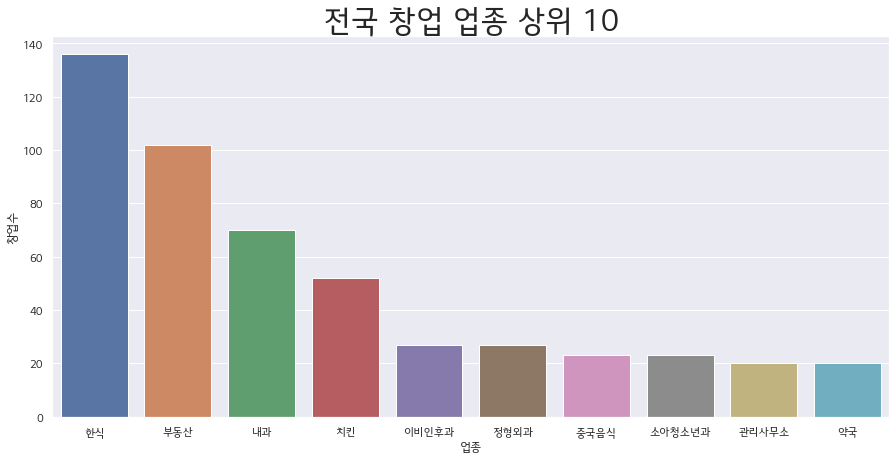

In [62]:
# 전국 창업 업종 상위 10위
plt.figure(figsize = [15,7])
plt.title('전국 창업 업종 상위 10', size = 30)
sns.barplot(data=top_10_division1, x='업종', y='창업수')

In [63]:
seoul_top_10_division0 = pd.DataFrame({"업종":seoul_region[seoul_region['DIVISION'] == 0]['INDUTY_NM'].value_counts().index[0:10],
                                 "폐업수":seoul_region[seoul_region['DIVISION'] == 0]['INDUTY_NM'].value_counts().values[0:10]})
seoul_top_10_division1 = pd.DataFrame({"업종":seoul_region[seoul_region['DIVISION'] == 1]['INDUTY_NM'].value_counts().index[0:10],
                                 "창업수":seoul_region[seoul_region['DIVISION'] == 1]['INDUTY_NM'].value_counts().values[0:10]})

<AxesSubplot:title={'center':'서울 폐업 업종 상위 10'}, xlabel='업종', ylabel='폐업수'>

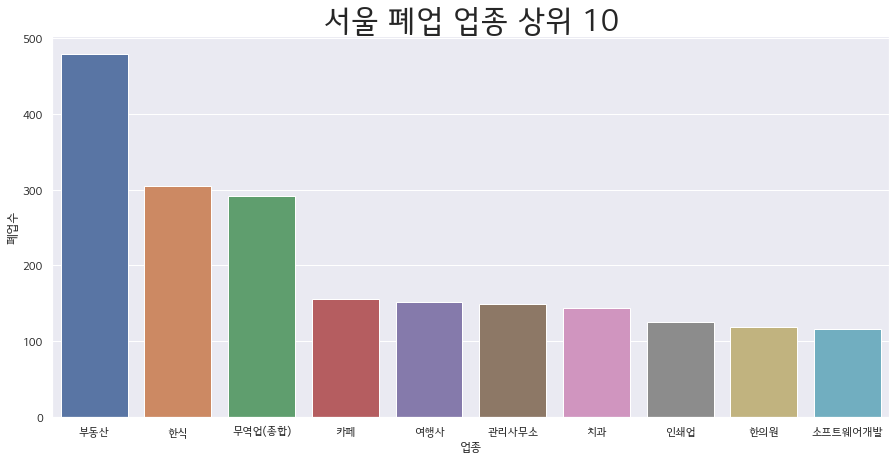

In [64]:
# 서울 폐업 업종 상위 10위
plt.figure(figsize = [15,7])
plt.title('서울 폐업 업종 상위 10', size = 30)
sns.barplot(data=seoul_top_10_division0, x='업종', y='폐업수')

<AxesSubplot:title={'center':'서울 창업 업종 상위 10'}, xlabel='업종', ylabel='창업수'>

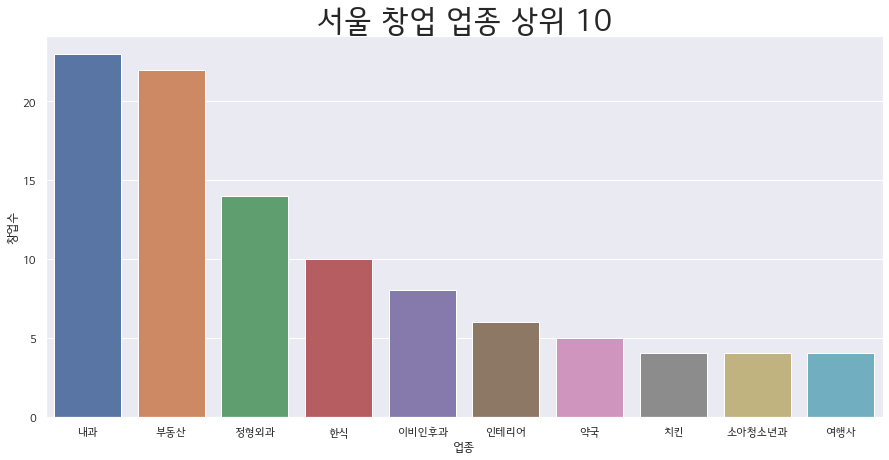

In [65]:
# 서울 창업 업종 상위 10위
plt.figure(figsize = [15,7])
plt.title('서울 창업 업종 상위 10', size = 30)
sns.barplot(data=seoul_top_10_division1, x='업종', y='창업수')

**위/경도 좌표 시각화를 위해 Folium 사용**

**서울시청으로 초기값 Set한후 우선 서울시의 창/폐업 상점의 좌표를 시각화함.**

**Blue : 폐업 , Red : 창업**

In [66]:
center = [37.566696 ,126.977942]    # 서울시청으로 초기 Set
stamen =folium.Map(location=center,tiles ='Stamen Toner', zoom_start=11) 

loc_0 = seoul_region[['LA_DCMLPOINT_VALUE','LO_DCMLPOINT_VALUE']].values[:len(seoul_region[seoul_region['DIVISION'] == 0]['LA_DCMLPOINT_VALUE'])].tolist()
loc_1 = seoul_region[['LA_DCMLPOINT_VALUE','LO_DCMLPOINT_VALUE']].values[:len(seoul_region[seoul_region['DIVISION'] == 1]['LA_DCMLPOINT_VALUE'])].tolist()

for i in range(len(seoul_region[seoul_region['DIVISION'] == 0]['LA_DCMLPOINT_VALUE'])):
    folium.Circle(location=loc_0[i],radius=5,color='blue',fill = True).add_to(stamen)

for i in range(len(seoul_region[seoul_region['DIVISION'] == 1]['LA_DCMLPOINT_VALUE'])):
    folium.Circle(location=loc_1[i],radius=5,color='red',fill = True).add_to(stamen)

stamen
                    

**서울시 지역 영역에 폐업 상점 단계구분도(Choropleth Map) 표시**

**단계구분도란 행정구역과 같이 지도 상의 어떤 경계에 둘러쌓여있는 영역에 색을 칠하거나 음영 등으로 정보를 나타내는 시각화 방법입니다.**

**서울시 동별 데이터는 하기 링크를 참고 하였습니다.**

**-참고 : https://github.com/vuski/admdongkor**

**폐업수가 많을 수록 색이 진하게 표시되며, 강남구의 폐업 상점이 가장 많은 것을 알 수 있습니다.**

In [67]:
jpath = './Seoul_HangJeongDong.json'
Seoul_HangJeongDong = json.load(open(jpath, encoding = 'utf-8'))

seoul_gu_df = pd.DataFrame({'행정동':seoul_region[seoul_region['DIVISION']==0]['SIGUNGU_NM'].value_counts().index,
                             '폐업수':seoul_region[seoul_region['DIVISION']==0]['SIGUNGU_NM'].value_counts().values}
                             )

seoul_map = folium.Map(location=center,tiles = 'openstreetmap', zoom_start=11) ; seoul_map

fmap = folium.Choropleth(geo_data = Seoul_HangJeongDong, 
                         data = seoul_gu_df,
                         columns = ['행정동','폐업수'],
                         key_on = 'feature.properties.sggnm', fill_color = 'YlOrRd', # 'BuGn', 'BuPu', 'GnBu', 'OrRd', 'PuBu', 'PuBuGn', 'PuRd', 'RdPu', 'YlGn', 'YlGnBu', 'YlOrBr', 'YlOrRd'
                         fill_opacity = 0.7,
                         line_opacity = 0.3,
                         legend_name = '폐업 상점수',
                         highlight = True
                        ).add_to(seoul_map)

folium.LayerControl().add_to(seoul_map)

fmap.geojson.zoom_on_click = False
fmap.geojson.add_child(folium.features.GeoJsonTooltip(['sggnm'],labels = False)
                      )

seoul_map.save('output/map1.html')
seoul_map

**강남구 폐업 상점을 좀 더 자세히 보기 위해 강남구 지역만 따로 시각화 하였습니다.**

**가장 폐업이 많은 업종인 한식의 경우 따로 마커로 추가하여 표시하였고, 시각화 한 결과 테헤란로 부근에서 많은 한식당이 폐업했다는 것을 알 수 있었습니다.**

In [69]:
gangnam = seoul_region[(seoul_region['DIVISION']==0) & (seoul_region['SIGUNGU_NM'] == '강남구')]

In [70]:
center = [37.517298, 127.047368]    # 강남구청으로 초기 Set
stamen =folium.Map(location=center,tiles ='Stamen Toner', zoom_start=13) 

gangnam_loc_0 = gangnam[['LA_DCMLPOINT_VALUE','LO_DCMLPOINT_VALUE']].values[:len(gangnam[gangnam['DIVISION'] == 0]['LA_DCMLPOINT_VALUE'])].tolist()


for i in range(len(gangnam[gangnam['DIVISION'] == 0]['LA_DCMLPOINT_VALUE'])):
    folium.Circle(location=gangnam_loc_0[i],radius=5,color='Green',fill = True).add_to(stamen)

gangnam_hansic_loc_0 = gangnam[['LA_DCMLPOINT_VALUE','LO_DCMLPOINT_VALUE']].values[:len(gangnam[(gangnam['DIVISION'] == 0) & (gangnam['INDUTY_NM']=='한식')]['LA_DCMLPOINT_VALUE'])].tolist()

# 한식 마커추가
for j in range(len(gangnam_hansic_loc_0)) :
    folium.Marker(location = gangnam_hansic_loc_0[j],icon = folium.Icon(color = 'blue',icon = 'info-sign')).add_to(stamen)
    
stamen